## Import Libraries & Set Configurations

In [1]:
import re
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.patches as mpatches
import matplotlib.font_manager as font_manager
import plotly.graph_objects as go
import statsmodels.api as sm


from os import getcwd, chdir, listdir
from datetime import timedelta
from datetime import datetime
from random import randint
from random import shuffle, sample


from matplotlib.font_manager import FontProperties, findfont
from matplotlib.patches import Patch
from plotly.subplots import make_subplots
from fuzzywuzzy import fuzz
from fuzzywuzzy import process
from peakutils import indexes
from sklearn.preprocessing import MinMaxScaler
from locale import setlocale
from scipy import stats
from statsmodels.tsa.stattools import adfuller
from scipy.stats import normaltest
from scipy.stats import mannwhitneyu
from scipy.stats import percentileofscore
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Set the option to display decimals rounded to 2 numbers
pd.set_option('display.float_format', '{:.2f}'.format)

# Set the option to display 274 max rows
pd.set_option('display.max_rows', 100)

# Set the option to display a max of 20 cols
pd.set_option('display.max.columns', 20)


## Utility Functions & Plot Calibration

In [2]:
# function to keep track of df objects in memory

def dfs():
    dataframes = [var for var in globals() if isinstance(globals()[var], pd.DataFrame)]
    print(dataframes)

In [3]:
dfs()

[]


In [4]:
# Function to list colors available in MpL
def list_mpl_colors():
    # List of named colors available in Matplotlib
    named_colors = mcolors.CSS4_COLORS
    # Print the named colors
    for color_name, color_code in named_colors.items():
        print(f"{color_name}: {color_code}")

In [5]:
list_mpl_colors()

aliceblue: #F0F8FF
antiquewhite: #FAEBD7
aqua: #00FFFF
aquamarine: #7FFFD4
azure: #F0FFFF
beige: #F5F5DC
bisque: #FFE4C4
black: #000000
blanchedalmond: #FFEBCD
blue: #0000FF
blueviolet: #8A2BE2
brown: #A52A2A
burlywood: #DEB887
cadetblue: #5F9EA0
chartreuse: #7FFF00
chocolate: #D2691E
coral: #FF7F50
cornflowerblue: #6495ED
cornsilk: #FFF8DC
crimson: #DC143C
cyan: #00FFFF
darkblue: #00008B
darkcyan: #008B8B
darkgoldenrod: #B8860B
darkgray: #A9A9A9
darkgreen: #006400
darkgrey: #A9A9A9
darkkhaki: #BDB76B
darkmagenta: #8B008B
darkolivegreen: #556B2F
darkorange: #FF8C00
darkorchid: #9932CC
darkred: #8B0000
darksalmon: #E9967A
darkseagreen: #8FBC8F
darkslateblue: #483D8B
darkslategray: #2F4F4F
darkslategrey: #2F4F4F
darkturquoise: #00CED1
darkviolet: #9400D3
deeppink: #FF1493
deepskyblue: #00BFFF
dimgray: #696969
dimgrey: #696969
dodgerblue: #1E90FF
firebrick: #B22222
floralwhite: #FFFAF0
forestgreen: #228B22
fuchsia: #FF00FF
gainsboro: #DCDCDC
ghostwhite: #F8F8FF
gold: #FFD700
goldenrod: #D

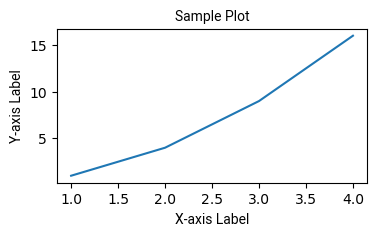

In [6]:
# Select font to use in plots
font_path = r'C:\Users\andre\AppData\Local\Microsoft\Windows\Fonts\Roboto-Regular.ttf'
roboto = font_manager.FontProperties(fname=font_path)

plt.figure(figsize=(4, 2))
# Create a sample plot
plt.plot([1, 2, 3, 4], [1, 4, 9, 16])

# Set the x and y axis labels 
plt.xlabel('X-axis Label', fontproperties=roboto, size=10)
plt.ylabel('Y-axis Label', fontproperties=roboto, size=10)

# Set the plot title 
plt.title('Sample Plot', fontproperties=roboto, size=10)

# Show the plot
plt.show()

## Set Working Directory, Import Datasets, & Review 

In [7]:
# Function to get & set working directory
def set_dir():
    cwd1 = getcwd()
    print(cwd1)
    chdir('C:\\Users\\andre\\Job Portfolio Projects\\DataGlacierVI\\datasets')
    cwd2 = getcwd()
    print(cwd2)

In [8]:
set_dir()

C:\Users\andre\Job Portfolio Projects\DataGlacierVI
C:\Users\andre\Job Portfolio Projects\DataGlacierVI\datasets


In [9]:

# List contents of directory
data_files = listdir()

# Eclude README.md file
if 'README.md' in data_files:
    idx = data_files.index('README.md')
    del data_files[idx]


In [10]:
data_files

['.ipynb_checkpoints',
 'Cab_Data.csv',
 'cab_mdf1.csv',
 'cdf.csv',
 'cdf1.csv',
 'City.csv',
 'Customer_ID.csv',
 'Grids.py',
 'LICENSE.txt',
 'mdf.csv',
 'Transaction_ID.csv',
 'warnings.log',
 '__pycache__']

In [11]:
# Import all datasets
df1 = pd.read_csv('Cab_Data.csv')
df2 = pd.read_csv('City.csv')
df3 = pd.read_csv('Customer_ID.csv')
df4 = pd.read_csv('Transaction_ID.csv')

In [12]:
# Review Meta-data of Cab_Data.csv
display(df1.head())
display(df1.info())
display(df1.shape)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.63
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.85
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.63
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.60
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.78


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Transaction ID  359392 non-null  int64  
 1   Date of Travel  359392 non-null  int64  
 2   Company         359392 non-null  object 
 3   City            359392 non-null  object 
 4   KM Travelled    359392 non-null  float64
 5   Price Charged   359392 non-null  float64
 6   Cost of Trip    359392 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 19.2+ MB


None

(359392, 7)

In [13]:
# Review Meta-data of City.csv
display(df2.head())
display(df2.info())
display(df2.shape)

,City,Population,Users
0,NEW YORK NY,"8,405,837","302,149"
1,CHICAGO IL,"1,955,130","164,468"
2,LOS ANGELES CA,"1,595,037","144,132"
3,MIAMI FL,"1,339,155","17,675"
4,SILICON VALLEY,"1,177,609","27,247"


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     object
 2   Users       20 non-null     object
dtypes: object(3)
memory usage: 608.0+ bytes


None

(20, 3)

In [14]:
# Review Meta-data of Customer_ID.csv
display(df3.head())
display(df3.info())
display(df3.shape)

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         49171 non-null  int64 
 1   Gender              49171 non-null  object
 2   Age                 49171 non-null  int64 
 3   Income (USD/Month)  49171 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


None

(49171, 4)

In [15]:
# Review Meta-data of Transaction_ID.csv
display(df4.head())
display(df4.info())
display(df4.shape)

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


None

(440098, 3)

## Merge to Create Master DataFrame

In [16]:
# Merge df1 & df4 on 'Transaction ID'
mdf = df1.merge(df4, on='Transaction ID', how='inner')
mdf.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.63,29290,Card
1,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.85,27703,Card
2,10000013,42371,Pink Cab,ATLANTA GA,9.04,125.20,97.63,28712,Cash
3,10000014,42376,Pink Cab,ATLANTA GA,33.17,377.40,351.60,28020,Cash
4,10000015,42372,Pink Cab,ATLANTA GA,8.73,114.62,97.78,27182,Card


In [17]:
# Merge master dataframe & df3 on 'Customer ID'
mdf = mdf.merge(df3, on='Customer ID', how='inner')
mdf.head()

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,42377,Pink Cab,ATLANTA GA,30.45,370.95,313.63,29290,Card,Male,28,10813
1,10351127,43302,Yellow Cab,ATLANTA GA,26.19,598.70,317.42,29290,Cash,Male,28,10813
2,10412921,43427,Yellow Cab,ATLANTA GA,42.55,792.05,597.40,29290,Card,Male,28,10813
3,10000012,42375,Pink Cab,ATLANTA GA,28.62,358.52,334.85,27703,Card,Male,27,9237
4,10320494,43211,Yellow Cab,ATLANTA GA,36.38,721.10,467.12,27703,Card,Male,27,9237


In [18]:
# Rename df2 to cdf (city_dataframe)
cdf = df2

## Data Cleansing & Preprocessing

In [19]:
# Check both 'mdf' & 'cdf' for duplicates
def duplicates(df):
    before = df.shape[0]
    df = df.drop_duplicates()
    after = df.shape[0]
    return f'{before-after} duplicates were removed'

In [20]:
duplicates(mdf)

'0 duplicates were removed'

In [21]:
duplicates(cdf)

'0 duplicates were removed'

In [22]:
# Convert capital letters in columns to lowercase for uniformity 
def lowercase(df):
    for i, colname in enumerate(df):
        if df[colname].dtype == 'object':
            df[colname] = df[colname].str.lower()
    return df.head()
    

In [23]:
lowercase(mdf)

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,42377,pink cab,atlanta ga,30.45,370.95,313.63,29290,card,male,28,10813
1,10351127,43302,yellow cab,atlanta ga,26.19,598.70,317.42,29290,cash,male,28,10813
2,10412921,43427,yellow cab,atlanta ga,42.55,792.05,597.40,29290,card,male,28,10813
3,10000012,42375,pink cab,atlanta ga,28.62,358.52,334.85,27703,card,male,27,9237
4,10320494,43211,yellow cab,atlanta ga,36.38,721.10,467.12,27703,card,male,27,9237


In [24]:
lowercase(cdf)

,City,Population,Users
0,new york ny,"8,405,837","302,149"
1,chicago il,"1,955,130","164,468"
2,los angeles ca,"1,595,037","144,132"
3,miami fl,"1,339,155","17,675"
4,silicon valley,"1,177,609","27,247"


In [25]:
# Convert missing value representations to NaN, if any
mdf.replace(['n/a', '-999', '?', '###', '-', 'na', 'null'], float('NaN'), inplace=True)
cdf.replace(['n/a', '-999', '?', '###', '-', 'na', 'null'], float('NaN'), inplace=True)
display(mdf.isnull().sum())
display(cdf.isnull().sum())

Transaction ID        0
Date of Travel        0
Company               0
City                  0
KM Travelled          0
Price Charged         0
Cost of Trip          0
Customer ID           0
Payment_Mode          0
Gender                0
Age                   0
Income (USD/Month)    0
dtype: int64

City          0
Population    0
Users         0
dtype: int64

In [26]:
# Rename columns of dataframe
mdf_names = {'Transaction ID':'trans_id', 'Date of Travel':'date', 'Company':'company', 'City':'city', 
             'KM Travelled':'trip_miles', 'Price Charged':'price', 'Cost of Trip':'cost', 'Customer ID':'cust_id', 
             'Payment_Mode':'payment_type', 'Gender':'gender', 'Age':'age', 'Income (USD/Month)':'income'}

# Create a mapper
cdf_names = {'City':'city', 'Population':'pop', 'Users':'users'}

# Rename columns
mdf.rename(columns=mdf_names, inplace=True)
cdf.rename(columns=cdf_names, inplace=True)

# Display
display(mdf.head())
display(cdf.head())

,trans_id,date,company,city,trip_miles,price,cost,cust_id,payment_type,gender,age,income
0,10000011,42377,pink cab,atlanta ga,30.45,370.95,313.63,29290,card,male,28,10813
1,10351127,43302,yellow cab,atlanta ga,26.19,598.70,317.42,29290,cash,male,28,10813
2,10412921,43427,yellow cab,atlanta ga,42.55,792.05,597.40,29290,card,male,28,10813
3,10000012,42375,pink cab,atlanta ga,28.62,358.52,334.85,27703,card,male,27,9237
4,10320494,43211,yellow cab,atlanta ga,36.38,721.10,467.12,27703,card,male,27,9237


,city,pop,users
0,new york ny,"8,405,837","302,149"
1,chicago il,"1,955,130","164,468"
2,los angeles ca,"1,595,037","144,132"
3,miami fl,"1,339,155","17,675"
4,silicon valley,"1,177,609","27,247"


In [27]:
km_per_mile = 1.609934

# Transform the 'trip_miles' feature from "km's" to 'miles' 30.45
mdf['trip_miles'] = mdf['trip_miles']/km_per_mile
mdf.head()

,trans_id,date,company,city,trip_miles,price,cost,cust_id,payment_type,gender,age,income
0,10000011,42377,pink cab,atlanta ga,18.91,370.95,313.63,29290,card,male,28,10813
1,10351127,43302,yellow cab,atlanta ga,16.27,598.70,317.42,29290,cash,male,28,10813
2,10412921,43427,yellow cab,atlanta ga,26.43,792.05,597.40,29290,card,male,28,10813
3,10000012,42375,pink cab,atlanta ga,17.78,358.52,334.85,27703,card,male,27,9237
4,10320494,43211,yellow cab,atlanta ga,22.60,721.10,467.12,27703,card,male,27,9237


In [28]:
# Switch Excel date format to standard date format
mdf['date'] = pd.to_datetime('1900-01-01') + pd.to_timedelta(mdf['date'] - 2, unit = 'D')
mdf.head()

,trans_id,date,company,city,trip_miles,price,cost,cust_id,payment_type,gender,age,income
0,10000011,2016-01-08,pink cab,atlanta ga,18.91,370.95,313.63,29290,card,male,28,10813
1,10351127,2018-07-21,yellow cab,atlanta ga,16.27,598.70,317.42,29290,cash,male,28,10813
2,10412921,2018-11-23,yellow cab,atlanta ga,26.43,792.05,597.40,29290,card,male,28,10813
3,10000012,2016-01-06,pink cab,atlanta ga,17.78,358.52,334.85,27703,card,male,27,9237
4,10320494,2018-04-21,yellow cab,atlanta ga,22.60,721.10,467.12,27703,card,male,27,9237


In [29]:
# Create quarter labels
qrtr_labels = {1:'Q1', 2:'Q2', 3:'Q3', 4:'Q4'}

# Extract the 'quarter' into a feature column
mdf['quarter'] = pd.to_datetime(mdf['date']).dt.quarter

# Map 'qrtr_labels' to the feature column
mdf['quarter'] = mdf['quarter'].map(qrtr_labels)

# Extract the 'year' into a feature column
mdf['year'] = pd.to_datetime(mdf['date']).dt.year

# Concatenate the 'quarter' and 'year' columns into the 'quarters' feature column
mdf['quarters'] = mdf['quarter'].astype(str) + '-' + mdf['year'].astype(str)

# Display
mdf.head()

,trans_id,date,company,city,trip_miles,price,cost,cust_id,payment_type,gender,age,income,quarter,year,quarters
0,10000011,2016-01-08,pink cab,atlanta ga,18.91,370.95,313.63,29290,card,male,28,10813,Q1,2016,Q1-2016
1,10351127,2018-07-21,yellow cab,atlanta ga,16.27,598.70,317.42,29290,cash,male,28,10813,Q3,2018,Q3-2018
2,10412921,2018-11-23,yellow cab,atlanta ga,26.43,792.05,597.40,29290,card,male,28,10813,Q4,2018,Q4-2018
3,10000012,2016-01-06,pink cab,atlanta ga,17.78,358.52,334.85,27703,card,male,27,9237,Q1,2016,Q1-2016
4,10320494,2018-04-21,yellow cab,atlanta ga,22.60,721.10,467.12,27703,card,male,27,9237,Q2,2018,Q2-2018


In [30]:
def city_state_split(series1, name1, series2, name2):
    # Create a generic list
    lst1 = []
    for city in series1[name1]:
        lst2 = city.split()
        lst1.append(lst2[-1])

    # Create a new Series object 
    state = pd.Series(lst1)
    series2[name2] = state

    # Replace 'state' in the 'city' column
    lst3 = []
    for city in series1[name1]:
        lst4 = city.split()
        del lst4[-1]
        new_city = ' '.join(lst4)
        lst3.append(new_city)
    
    # Create new series
    series1[name1] = lst3
    
    # Replace 'county' & 'valley' with 'ca'
    for i in range(len(series2[name2])):
        if series2[name2][i] == 'county' or series2[name2][i] == 'valley':
            series2.loc[i, name2] = 'ca'


In [31]:
city_state_split(mdf, 'city', mdf, 'state')

# List 'mdf' columns
new_order = ['date', 'trans_id', 'cust_id', 'company', 
             'city', 'state', 'trip_miles', 'price', 
             'cost','payment_type', 'gender', 'age', 
             'income', 'quarter', 'year', 'quarters']

# Reorder 'mdf' columns
mdf = mdf.reindex(columns=new_order)
    
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,28,10813,Q1,2016,Q1-2016
1,2018-07-21,10351127,29290,yellow cab,atlanta,ga,16.27,598.70,317.42,cash,male,28,10813,Q3,2018,Q3-2018
2,2018-11-23,10412921,29290,yellow cab,atlanta,ga,26.43,792.05,597.40,card,male,28,10813,Q4,2018,Q4-2018
3,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,27,9237,Q1,2016,Q1-2016
4,2018-04-21,10320494,27703,yellow cab,atlanta,ga,22.60,721.10,467.12,card,male,27,9237,Q2,2018,Q2-2018


In [32]:
# Make a profit column
mdf['profit'] = mdf['price'] - mdf['cost']
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,28,10813,Q1,2016,Q1-2016,57.31
1,2018-07-21,10351127,29290,yellow cab,atlanta,ga,16.27,598.70,317.42,cash,male,28,10813,Q3,2018,Q3-2018,281.28
2,2018-11-23,10412921,29290,yellow cab,atlanta,ga,26.43,792.05,597.40,card,male,28,10813,Q4,2018,Q4-2018,194.65
3,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,27,9237,Q1,2016,Q1-2016,23.67
4,2018-04-21,10320494,27703,yellow cab,atlanta,ga,22.60,721.10,467.12,card,male,27,9237,Q2,2018,Q2-2018,253.98


In [33]:
# Create a 'day-of-the-week' column so we can analyze the busiest days
mdf['day_of_week'] = mdf['date'].dt.day_name().str.lower()
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,28,10813,Q1,2016,Q1-2016,57.31,friday
1,2018-07-21,10351127,29290,yellow cab,atlanta,ga,16.27,598.70,317.42,cash,male,28,10813,Q3,2018,Q3-2018,281.28,saturday
2,2018-11-23,10412921,29290,yellow cab,atlanta,ga,26.43,792.05,597.40,card,male,28,10813,Q4,2018,Q4-2018,194.65,friday
3,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,27,9237,Q1,2016,Q1-2016,23.67,wednesday
4,2018-04-21,10320494,27703,yellow cab,atlanta,ga,22.60,721.10,467.12,card,male,27,9237,Q2,2018,Q2-2018,253.98,saturday


In [34]:
# We will save 25% of the memory by converting data types from 'object' to 'category' 41.1+ MB --> 29.1 MB
for colname in mdf:
    if mdf[colname].dtype == 'object' and colname != 'day_of_week':
        mdf[colname] = pd.Categorical(mdf[colname], ordered=False)
    
    # Convert 'day_of_week' to ordinal data
    elif mdf[colname].dtype == 'object' and colname == 'day_of_week':
        mdf[colname] = pd.Categorical(mdf[colname], categories=['sunday', 'monday', 'tuesday', 'wednesday',
                                                                'thursday', 'friday', 'saturday'], ordered=True)

mdf.info()   

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          359392 non-null  datetime64[ns]
 1   trans_id      359392 non-null  int64         
 2   cust_id       359392 non-null  int64         
 3   company       359392 non-null  category      
 4   city          359392 non-null  category      
 5   state         359392 non-null  category      
 6   trip_miles    359392 non-null  float64       
 7   price         359392 non-null  float64       
 8   cost          359392 non-null  float64       
 9   payment_type  359392 non-null  category      
 10  gender        359392 non-null  category      
 11  age           359392 non-null  int64         
 12  income        359392 non-null  int64         
 13  quarter       359392 non-null  category      
 14  year          359392 non-null  int64         
 15  quarters      359

In [35]:
# Create age_labels and bin-edges
age_labels = ['18-24', '25-34', '35-54', '55-64']
age_bins = [17, 25, 35, 55, 65]

# Apply the labels to the 'age' column
mdf['age'] = pd.cut(x=mdf['age'], bins=age_bins, labels=age_labels, ordered=True)

# Display
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,25-34,10813,Q1,2016,Q1-2016,57.31,friday
1,2018-07-21,10351127,29290,yellow cab,atlanta,ga,16.27,598.70,317.42,cash,male,25-34,10813,Q3,2018,Q3-2018,281.28,saturday
2,2018-11-23,10412921,29290,yellow cab,atlanta,ga,26.43,792.05,597.40,card,male,25-34,10813,Q4,2018,Q4-2018,194.65,friday
3,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,25-34,9237,Q1,2016,Q1-2016,23.67,wednesday
4,2018-04-21,10320494,27703,yellow cab,atlanta,ga,22.60,721.10,467.12,card,male,25-34,9237,Q2,2018,Q2-2018,253.98,saturday


In [36]:
# Use regex to remove commas from 'pop' and 'users'

cdf['pop'] = cdf['pop'].str.replace(r',', '', regex=True).astype('int64')
cdf['users'] = cdf['users'].str.replace(r',', '', regex=True).astype('int64')
cdf.head()

,city,pop,users
0,new york ny,8405837,302149
1,chicago il,1955130,164468
2,los angeles ca,1595037,144132
3,miami fl,1339155,17675
4,silicon valley,1177609,27247


In [37]:
# Create feature
cdf['% of users'] = cdf['users']/cdf['pop']
cdf.head()

,city,pop,users,% of users
0,new york ny,8405837,302149,0.04
1,chicago il,1955130,164468,0.08
2,los angeles ca,1595037,144132,0.09
3,miami fl,1339155,17675,0.01
4,silicon valley,1177609,27247,0.02


In [38]:
# Use function to separate the city and state to create a new 'state' feature
city_state_split(cdf, 'city', cdf, 'state')

# Sort by 'city' 
cdf.sort_values(by='city', inplace=True)

# Reset the index
cdf.reset_index(drop=True, inplace=True)

# Display
cdf.head()

,city,pop,users,% of users,state
0,atlanta,814885,24701,0.03,ga
1,austin,698371,14978,0.02,tx
2,boston,248968,80021,0.32,ma
3,chicago,1955130,164468,0.08,il
4,dallas,942908,22157,0.02,tx


In [39]:
# Customer Reach      2016-01-02 to 2018-12-31 = 2.995 years
# Customer Retention
# Age demographics
# Profit per Mile
# Cost per Mile
# Income Wise Reach
# Ride Count and profit forecasting

## Initial Exploration of Features

In [40]:
# List continuous features
cont_features = ['trip_miles', 'price', 'cost', 'income', 'profit']

# List Categorical
cat_features = ['company', 'city', 'state', 'payment_type', 'gender', 'age', 'quarter', 'year', 'quarters' 'day_of_week']

In [41]:
mdf

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week
0,2016-01-08,10000011,29290,pink cab,atlanta,ga,18.91,370.95,313.63,card,male,25-34,10813,Q1,2016,Q1-2016,57.31,friday
1,2018-07-21,10351127,29290,yellow cab,atlanta,ga,16.27,598.70,317.42,cash,male,25-34,10813,Q3,2018,Q3-2018,281.28,saturday
2,2018-11-23,10412921,29290,yellow cab,atlanta,ga,26.43,792.05,597.40,card,male,25-34,10813,Q4,2018,Q4-2018,194.65,friday
3,2016-01-06,10000012,27703,pink cab,atlanta,ga,17.78,358.52,334.85,card,male,25-34,9237,Q1,2016,Q1-2016,23.67,wednesday
4,2018-04-21,10320494,27703,yellow cab,atlanta,ga,22.60,721.10,467.12,card,male,25-34,9237,Q2,2018,Q2-2018,253.98,saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359387,2018-01-07,10439790,38520,yellow cab,seattle,wa,10.35,261.18,213.91,card,female,35-54,19417,Q1,2018,Q1-2018,47.27,sunday
359388,2018-01-03,10439799,12490,yellow cab,silicon,ca,8.52,277.97,172.87,cash,male,25-34,18713,Q1,2018,Q1-2018,105.10,wednesday
359389,2018-01-04,10439838,41414,yellow cab,tucson,az,11.80,303.77,232.56,card,male,35-54,3960,Q1,2018,Q1-2018,71.21,thursday
359390,2018-01-06,10439840,41677,yellow cab,tucson,az,3.48,92.42,70.56,cash,male,18-24,19454,Q1,2018,Q1-2018,21.86,saturday


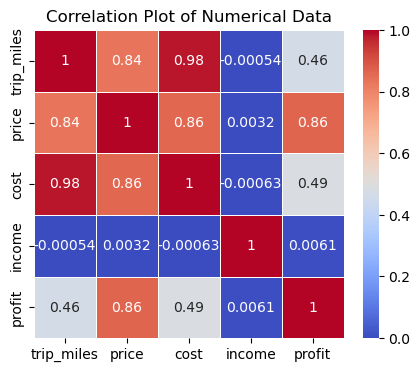

In [42]:
corr_matrix = mdf[cont_features].corr()
corr_matrix

# Plot the correlation matrix as a heatmap
plt.figure(figsize=(5, 4))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Plot of Numerical Data')
plt.show()

<Figure size 500x400 with 0 Axes>

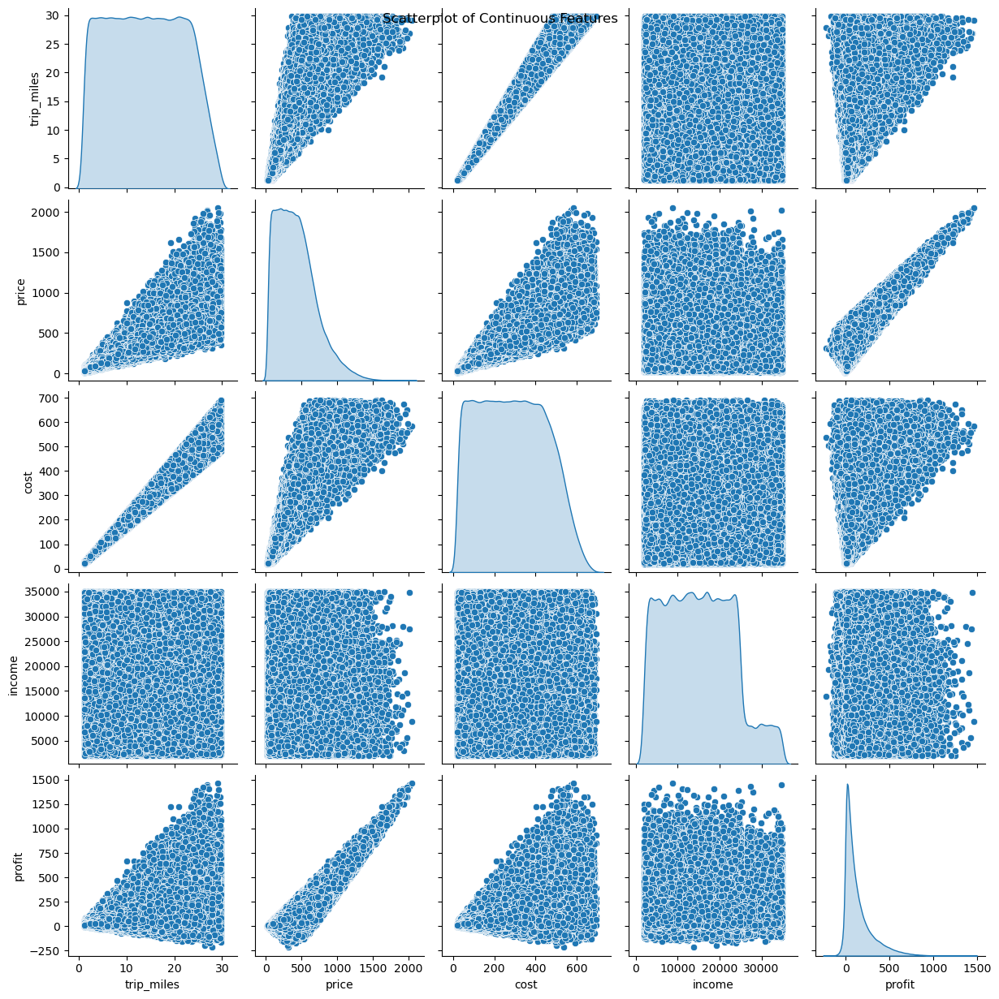

In [43]:
# Scatter Plot of all cont_features
plt.figure(figsize=(5, 4))
sns.pairplot(mdf[cont_features], diag_kind='kde')
plt.suptitle('Scatterplot of Continuous Features')
plt.show()

### Outlier Analysis

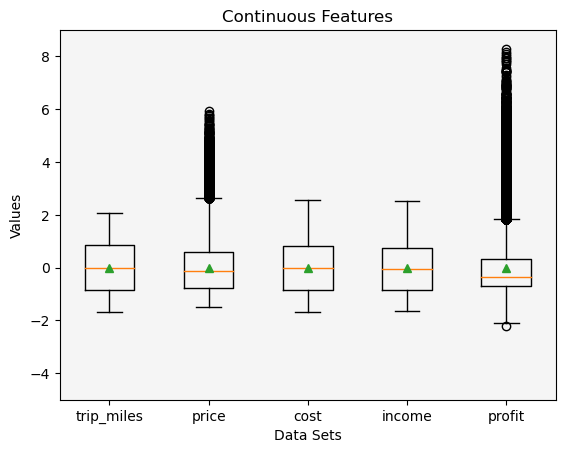

In [44]:
# Assuming cont_features is a list of continuous feature column names
# Extract the continuous features into a DataFrame
cont_features_df = mdf[cont_features]

# Instantiate standard scaler object
scaler1 = StandardScaler(with_mean=True, with_std=True, copy=True)

# Fit and transform the DataFrame using StandardScaler
cont_feat_copy = scaler1.fit_transform(cont_features_df)

# Convert the scaled data back to a DataFrame
cont_feat_copy_df = pd.DataFrame(cont_feat_copy, columns=cont_features_df.columns)

# Combine the data into a list or tuple
data = [cont_feat_copy_df['trip_miles'], cont_feat_copy_df['price'], cont_feat_copy_df['cost'], 
        cont_feat_copy_df['income'], cont_feat_copy_df['profit']]

# Create a figure and axes
fig, ax = plt.subplots()

# Create the boxplots
ax.boxplot(data, showmeans=True)

# Add labels to the x-axis tick positions
ax.set_xticklabels(['trip_miles', 'price', 'cost', 'income', 'profit'])

# Add a title and labels
ax.set_facecolor('whitesmoke')
ax.set_title('Continuous Features')
ax.set_xlabel('Data Sets')
ax.set_ylabel('Values')
ax.set_ylim(-5, 9)

# Show the plot
plt.show()



## Save Progress

In [45]:
# Save 'mdf' & rest of progress
mdf.to_csv('mdf.csv', index=False)

# Save 'cdf' & rest of progress
mdf.to_csv('cdf.csv', index=False)

In [46]:
# set_dir()

In [47]:
# # Read in 'mdf'
# mdf = pd.read_csv('mdf.csv')

# # Read in 'cdf'
# cdf = pd.read_csv('cdf.csv')

In [48]:
mdf.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   date          359392 non-null  datetime64[ns]
 1   trans_id      359392 non-null  int64         
 2   cust_id       359392 non-null  int64         
 3   company       359392 non-null  category      
 4   city          359392 non-null  category      
 5   state         359392 non-null  category      
 6   trip_miles    359392 non-null  float64       
 7   price         359392 non-null  float64       
 8   cost          359392 non-null  float64       
 9   payment_type  359392 non-null  category      
 10  gender        359392 non-null  category      
 11  age           359392 non-null  category      
 12  income        359392 non-null  int64         
 13  quarter       359392 non-null  category      
 14  year          359392 non-null  int64         
 15  quarters      359

In [49]:
mdf.index = pd.to_datetime(mdf.index)

# Descriptive Statistics

In [50]:
# Get summary stats from a subset of 'mdf'
ydescriptive = mdf[mdf['company']=='yellow cab'][cont_features].describe()
ydescriptive

,trip_miles,price,cost,income,profit
count,274681.00,274681.00,274681.00,274681.00,274681.00
mean,14.02,458.18,297.92,15045.67,160.26
std,7.60,288.39,162.55,7962.73,171.82
min,1.18,20.73,22.80,2000.00,-176.93
25%,7.45,226.68,158.40,8439.00,37.18
50%,13.94,425.06,295.60,14676.00,102.00
75%,20.47,633.88,432.43,21023.00,228.67
max,29.81,2048.03,691.20,34996.00,1463.97


In [51]:
# Get summary stats from a subset of 'mdf'
pdescriptive = mdf[mdf['company'] == 'pink cab'][cont_features].describe()
pdescriptive

,trip_miles,price,cost,income,profit
count,84711.00,84711.00,84711.00,84711.00,84711.00
mean,14.01,310.80,248.15,15059.05,62.65
std,7.60,182.00,135.40,7991.08,77.59
min,1.18,15.60,19.00,2000.00,-220.06
25%,7.45,159.97,131.87,8371.00,11.21
50%,13.94,298.06,246.33,14713.00,41.50
75%,20.47,441.50,360.18,21055.00,93.97
max,29.81,1623.48,576.00,35000.00,1119.48


In [52]:
# yellow avg price per mile
yavg_ppm = ydescriptive['price']['mean']/ydescriptive['trip_miles']['mean']
print(yavg_ppm)

# yellow avg cost per mile
yavg_cpm = ydescriptive['cost']['mean']/ydescriptive['trip_miles']['mean']
display(yavg_cpm)

# yellow avg profit per mile
yavg_prpm = ydescriptive['profit']['mean']/ydescriptive['trip_miles']['mean']
display(yavg_prpm)

# pink avg price per mile
pavg_ppm = pdescriptive['price']['mean']/pdescriptive['trip_miles']['mean']
display(pavg_ppm)

# pink avg cost per mile
pavg_cpm = pdescriptive['cost']['mean']/pdescriptive['trip_miles']['mean']
display(pavg_cpm)

# pink avg cost per mile
pavg_prpm = pdescriptive['profit']['mean']/pdescriptive['trip_miles']['mean']
display(pavg_prpm)



32.68314369855551


21.251441316305918

11.431702382249588

22.179552815073738

17.70853165506128

4.471021160012457

In [53]:
# Number of days in entire data set
tot_num_days = len(mdf.index.unique())
display(tot_num_days)

# Length of a year in days
year_len = 365.25

# Years in data set
display(tot_num_days/year_len)


pink_cab = mdf[mdf['company'] == 'pink cab']
num_pink_fares = len(pink_cab)
display(num_pink_fares)
        
yellow_cab = mdf[mdf['company'] == 'yellow cab']
num_yellow_fares = len(yellow_cab)
display(num_yellow_fares)

# Pink cab profit margin
pink_revenue = pink_cab['price'].sum()
pink_profits = pink_cab['profit'].sum()
pink_profit_margin = pink_profits/pink_revenue
display(pink_profit_margin.round(2))

# Yellow cab profit margin
yellow_revenue = yellow_cab['price'].sum()
yellow_profit = yellow_cab['profit'].sum()
yellow_profit_margin = yellow_profit/yellow_revenue
display(yellow_profit_margin.round(2))

# Pink cab avg price per fare
pink_avg_fare = pink_cab['price'].sum()/num_pink_fares
display(pink_avg_fare.round(2))

# Pink avg profit per mile
#pink_avg_prft_mile = 

# Yellow cab avg price per fare
yellow_avg_fare = yellow_cab['price'].sum()/num_yellow_fares
display(yellow_avg_fare.round(2))

# Pinks avg miles per fare
pink_avg_mile = pink_cab['trip_miles'].sum()/num_pink_fares
display(pink_avg_mile.round(2))

# Yellow avg miles per fare
yellow_avg_mile = yellow_cab['trip_miles'].sum()/num_yellow_fares
display(yellow_avg_mile.round(2))

# How many more fares did yellow have over pink
display(yellow_avg_fare/pink_avg_fare)
display(num_yellow_fares - num_pink_fares)


359392

983.9616700889801

84711

274681

0.2

0.35

310.8

458.18

14.01

14.02

1.4741979657822346

189970

## Does Cab Company Impact Client Frequency?

In [54]:
# Function to format plots similarly
def format_plot(data, fig, ax, xlab, ylab, title):
    
    # Set font size
    plt.yticks(fontsize=5)

    # Set labels and title
    ax.set_xlabel(xlab, fontproperties=roboto, fontsize=1)
    ax.set_xticks(np.arange(min(data), max(data) + 1), fontsize=7, fontproperties=roboto)
    ax.set_ylabel(ylab, fontproperties=roboto, fontsize=4)
    ax.set_title(f'{title}', fontproperties=roboto, fontsize=9)
    
    ax.tick_params(axis='x', labelrotation=45, labelsize=7)

#     # Hide the right and top spines
#     ax.spines['right'].set_visible(False)
#     ax.spines['top'].set_visible(False)

    ax.spines['left'].set_linewidth(.5)
    ax.spines['bottom'].set_linewidth(.5)
    ax.spines['top'].set_linewidth(.3)
    ax.spines['right'].set_linewidth(.3)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1, 1), prop={'size': 7})

    # Set ax facecolor
    ax = plt.gca()
    ax.set_facecolor('whitesmoke')

    # Set the figure face color
    # Get the current Figure object
    fig = plt.gcf()

    # Set the background color of the figure
    #fig.set_facecolor('lightgray') 

    # Set the color of the plot perimeter (spines)
    perimeter_color = 'black'  # Set the desired perimeter color
    ax.spines['top'].set_color(perimeter_color)
    ax.spines['right'].set_color(perimeter_color)
    ax.spines['bottom'].set_color(perimeter_color)
    ax.spines['left'].set_color(perimeter_color)

    # Display the plot
    plt.tight_layout()
    plt.grid(True, linewidth=.1, color='black')
    plt.show()
  

## Separate Customers According to Cab Company Choice

In [55]:
# Create a dictionary to store the sub dataframes
sub_dfs = {}

# Group the master dataframe by customer ID and aggregate unique cab companies as a list
grouped = mdf.groupby('cust_id')['company'].unique().reset_index()

# Rename the column for clarity
grouped.rename(columns={'company': 'unique_companies'}, inplace=True)

# Convert the unique_companies column to a list
grouped['unique_companies'] = grouped['unique_companies'].apply(list)

lst1 = []
lst2 = []
lst3 = []

for lst in grouped.iterrows():    
    if len(lst[1][1]) == 1 and lst[1][1][0] == 'pink cab':
        lst1.append(lst[1][0])
    elif len(lst[1][1]) == 1 and lst[1][1][0] == 'yellow cab':
        lst3.append(lst[1][0])
    elif len(lst[1][1]) == 2:
        lst2.append(lst[1][0])

# Create separate dataframes based on the customer lists
pcab = mdf[mdf['cust_id'].isin(lst1)]
ycab = mdf[mdf['cust_id'].isin(lst3)]
pcabycab = mdf[mdf['cust_id'].isin(lst2)]

print(len(pcab) == len(lst1))
print(len(ycab))
print(len(pcabycab))


grouped.head()

False
40453
310518


,cust_id,unique_companies
0,1,"[yellow cab, pink cab]"
1,2,"[yellow cab, pink cab]"
2,3,"[yellow cab, pink cab]"
3,4,"[yellow cab, pink cab]"
4,5,"[pink cab, yellow cab]"


In [56]:
print(len(pcab))
print(len(ycab))
print(len(pcabycab))

8421
40453
310518


In [57]:
pcab.describe()

,trans_id,cust_id,trip_miles,price,cost,income,year,profit
count,8421.00,8421.00,8421.00,8421.00,8421.00,8421.00,8421.00,8421.00
mean,10223318.27,33596.56,13.89,299.64,245.80,15022.20,2017.05,53.84
std,125536.38,14870.05,7.62,181.03,135.88,8021.10,0.80,81.86
min,10000064.00,6565.00,1.18,15.60,19.00,2001.00,2016.00,-153.25
25%,10112698.00,19555.00,7.30,148.76,128.26,8244.00,2016.00,4.59
50%,10222805.00,34038.00,13.79,285.15,243.60,14648.00,2017.00,31.92
75%,10336077.00,46969.00,20.35,422.80,358.72,21152.00,2018.00,83.28
max,10437582.00,59980.00,29.81,1377.73,561.68,35000.00,2018.00,971.17


In [58]:
ycab.describe()

,trans_id,cust_id,trip_miles,price,cost,income,year,profit
count,40453.00,40453.00,40453.00,40453.00,40453.00,40453.00,40453.00,40453.00
mean,10219766.25,36510.16,13.99,410.11,297.15,15032.27,2017.04,112.96
std,126957.45,17756.54,7.62,246.13,162.82,7971.25,0.80,121.10
min,10000384.00,20.00,1.18,22.11,22.80,2010.00,2016.00,-176.93
25%,10110793.00,24508.00,7.38,208.66,156.82,8450.00,2016.00,29.23
50%,10219267.00,37244.00,13.93,391.80,293.79,14666.00,2017.00,77.53
75%,10328650.00,52790.00,20.41,577.80,431.61,21022.00,2018.00,160.35
max,10440096.00,59996.00,29.81,1993.83,691.20,34996.00,2018.00,1399.11


In [59]:
pcabycab.describe()

,trans_id,cust_id,trip_miles,price,cost,income,year,profit
count,310518.00,310518.00,310518.00,310518.00,310518.00,310518.00,310518.00,310518.00
mean,10220821.46,16544.82,14.02,428.54,285.86,15051.70,2017.05,142.68
std,126819.47,20303.64,7.60,279.08,157.72,7967.79,0.80,165.40
min,10000011.00,1.00,1.18,16.38,19.00,2000.00,2016.00,-220.06
25%,10110805.25,2356.00,7.45,208.29,151.20,8428.00,2016.00,28.87
50%,10221446.50,6109.00,13.96,389.32,282.17,14686.00,2017.00,84.54
75%,10331061.75,20962.00,20.49,589.39,413.00,21035.00,2018.00,199.00
max,10440107.00,60000.00,29.81,2048.03,691.20,34996.00,2018.00,1463.97


In [60]:
# Group the data
rides_by_cust = mdf.groupby(['cust_id', 'company']).size().unstack(fill_value=0)

# Separate the ride counts for Pink Cab and Yellow Cab
prides_by_cust = pcab.groupby(['cust_id', 'company']).size().unstack(fill_value=0)
yrides_by_cust = ycab.groupby(['cust_id', 'company']).size().unstack(fill_value=0)
pcabycabrides_by_cust = pcabycab.groupby(['cust_id', 'company']).size().unstack(fill_value=0)



In [61]:
prides_by_cust = prides_by_cust['pink cab']
yrides_by_cust = yrides_by_cust['yellow cab']


pcaby_rides_by_cust = pcabycabrides_by_cust['pink cab']
ycabp_rides_by_cust = pcabycabrides_by_cust['yellow cab']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


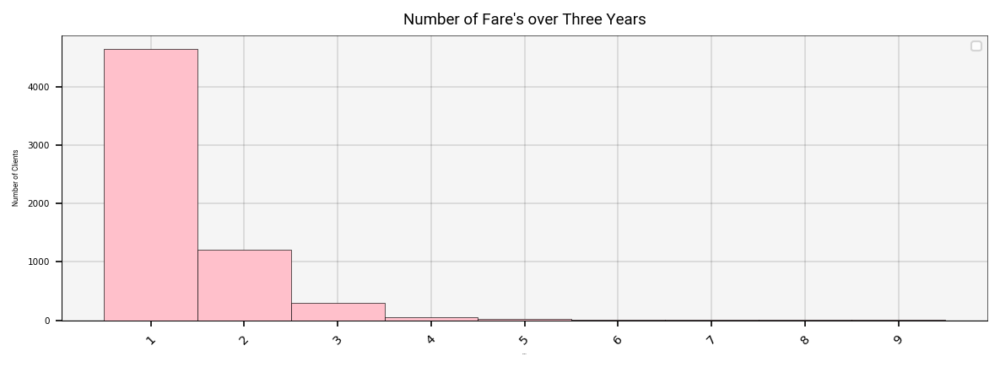

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


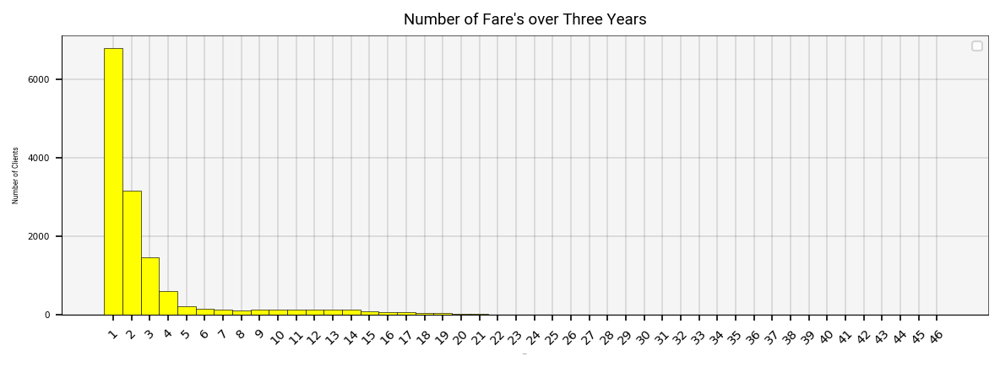

In [62]:
# Create a figure with two subplots (one on top of another)
fig1, ax1 = plt.subplots(figsize=(8, 3), dpi=150)

# Create histograms for each subplot
bins1 = np.arange(min(prides_by_cust) - 0.5, max(prides_by_cust) + 1.5, 1)
ax1.hist(prides_by_cust, bins=bins1, color='pink', edgecolor='black', linewidth=0.3, zorder=4)
format_plot(prides_by_cust, fig, ax1, "Fare's", 'Number of Clients', "Number of Fare's over Three Years" )

# Histogram of both cab company 

fig2, ax2 = plt.subplots(figsize=(8, 3), dpi=150)

bins2 = np.arange(min(yrides_by_cust) - 0.5, max(yrides_by_cust) + 1.5, 1)
ax2.hist(yrides_by_cust, bins=bins2, color='yellow', edgecolor='black', linewidth=0.3, zorder=4)
format_plot(yrides_by_cust, fig, ax2, "Fare's", 'Number of Clients', "Number of Fare's over Three Years")

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


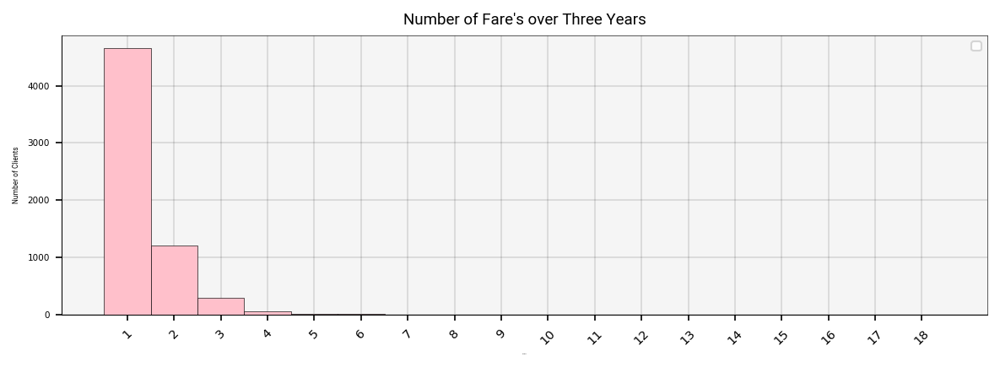

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


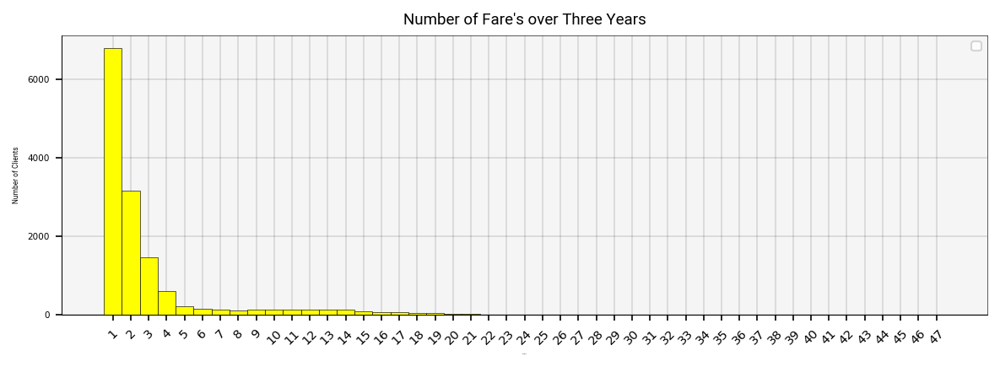

In [63]:
# Create a figure with two subplots (one on top of another)
fig1, ax1 = plt.subplots(figsize=(8, 3), dpi=150)

# Create histograms for each subplot
bins1 = np.arange(min(pcaby_rides_by_cust) - 0.5, max(pcaby_rides_by_cust) + 1.5, 1)
ax1.hist(prides_by_cust, bins=bins1, color='pink', edgecolor='black', linewidth=0.3, zorder=4)
format_plot(pcaby_rides_by_cust, fig, ax1, "Fare's", 'Number of Clients', "Number of Fare's over Three Years" )

# Histogram of both cab company 

fig2, ax2 = plt.subplots(figsize=(8, 3), dpi=150)

bins2 = np.arange(min(ycabp_rides_by_cust) - 0.5, max(ycabp_rides_by_cust) + 1.5, 1)
ax2.hist(yrides_by_cust, bins=bins2, color='yellow', edgecolor='black', linewidth=0.3, zorder=4)
format_plot(ycabp_rides_by_cust, fig, ax2, "Fare's", 'Number of Clients', "Number of Fare's over Three Years")

## More Descriptive Statistics

In [64]:
ynum_cust = mdf[mdf['company'] == 'yellow cab']['cust_id'].unique()
display(len(ynum_cust))

pnum_cust = mdf[mdf['company'] == 'pink cab']['cust_id'].unique()
display(len(pnum_cust))

print(f'Yellow Cab Company has {len(ynum_cust) - len(pnum_cust)} more unique customers than Pink Cab Company')

# Why do they have more customers?


39896

32330

Yellow Cab Company has 7566 more unique customers than Pink Cab Company


In [65]:
# Avg num of trips every 3 years

ynum_trips = mdf[mdf['company'] == 'yellow cab']['cust_id'].value_counts()
np.mean(ynum_trips)

6.884925807098456

In [66]:
# Avg num of trips every 3 years

pnum_trips = mdf[mdf['company'] == 'pink cab']['cust_id'].value_counts()
np.mean(pnum_trips)

2.620197958552428

In [67]:
# Yellow cab one time customers
yone_time_cust = mdf[mdf['company']=='yellow cab']['cust_id'].value_counts().eq(1).sum()
display(yone_time_cust)

# one time customers as percentage of total customers
display(yone_time_cust/len(ynum_cust))

12031

0.3015590535392019

In [68]:
# Pink cab one time customers
pone_time_cust = mdf[mdf['company']== 'pink cab']['cust_id'].value_counts().eq(1).sum()
pone_time_cust

# Pink Cab one time customers as percentage of total customers
display(pone_time_cust/len(pnum_cust))

0.44336529539127745

## Profitability

In [69]:
# Financial Metrics:

# Profitability: Calculate the overall profitability for each company by subtracting the total cost from the total revenue (sum of 'price' - 'cost' for all trips).
# Revenue: Compare the total revenue generated by each company.
# Cost Efficiency: Analyze the cost per trip or cost per mile for each company.
# Market Share Metrics:

# Total Market Share: Compare the overall market share of each company based on 'total mkt share'.
# Pink Market Share: Compare the market share for pink cabs ('pink mkt share').
# Yellow Market Share: Compare the market share for yellow cabs ('yellow mkt share').
# Operational Metrics:

# Average Trip Distance: Compare the average distance traveled per trip.
# Average Price: Compare the average price charged per trip.
# Average Cost: Compare the average cost incurred per trip.
# User Engagement: Analyze the number of users and the percentage of users for each company.
# Customer Demographics:

# Gender Distribution: Compare the distribution of male and female customers.
# Age Distribution: Analyze the age groups of customers for each company.
# Income Levels: Compare the income distribution of customers.
# Geographic Metrics:

# City Performance: Compare performance metrics across different cities.
# State Performance: Compare performance metrics across different states.
# Time-Based Metrics:

# Quarterly Performance: Analyze performance on a quarterly basis.
# Yearly Performance: Compare performance on a yearly basis.
# Profit Metrics:

# Profit Margin: Calculate the profit margin as (Profit / Revenue) * 100 to compare profitability relative to revenue.
# Average Profit per Trip: Compare the average profit earned per trip.
# Customer Satisfaction Metrics:

# Payment Type Distribution: Compare the distribution of payment types (cash, credit card, etc.).
# Rating Distribution: If available, compare customer ratings or satisfaction scores.

In [70]:
# Profitability: Calculate the overall profitability for each company by subtracting the total cost from the total revenue (sum of 'price' - 'cost' for all trips).
# Revenue: Compare the total revenue generated by each company.
# Cost Efficiency: Analyze the cost per trip or cost per mile for each company

In [71]:
mdf = mdf.sort_values(by='date').reset_index(drop=True)
mdf.head()

,date,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week
0,2016-01-02,10000600,3363,yellow cab,chicago,il,14.75,531.25,336.30,cash,male,25-34,23320,Q1,2016,Q1-2016,194.95,saturday
1,2016-01-02,10000171,20687,pink cab,san diego,ca,8.87,269.15,147.08,cash,male,35-54,8926,Q1,2016,Q1-2016,122.07,saturday
2,2016-01-02,10000640,4844,yellow cab,chicago,il,9.69,374.66,209.66,cash,male,25-34,5548,Q1,2016,Q1-2016,165.00,saturday
3,2016-01-02,10001242,14513,yellow cab,silicon,ca,11.19,658.65,240.03,card,male,55-64,3892,Q1,2016,Q1-2016,418.62,saturday
4,2016-01-02,10000434,59961,yellow cab,boston,ma,28.10,971.09,564.60,card,male,55-64,12377,Q1,2016,Q1-2016,406.49,saturday


In [72]:
mdf = mdf.set_index(keys='date', drop=True)
mdf.head()

,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week
date,,,,,,,,,,,,,,,,,
2016-01-02,10000600,3363,yellow cab,chicago,il,14.75,531.25,336.30,cash,male,25-34,23320,Q1,2016,Q1-2016,194.95,saturday
2016-01-02,10000171,20687,pink cab,san diego,ca,8.87,269.15,147.08,cash,male,35-54,8926,Q1,2016,Q1-2016,122.07,saturday
2016-01-02,10000640,4844,yellow cab,chicago,il,9.69,374.66,209.66,cash,male,25-34,5548,Q1,2016,Q1-2016,165.00,saturday
2016-01-02,10001242,14513,yellow cab,silicon,ca,11.19,658.65,240.03,card,male,55-64,3892,Q1,2016,Q1-2016,418.62,saturday
2016-01-02,10000434,59961,yellow cab,boston,ma,28.10,971.09,564.60,card,male,55-64,12377,Q1,2016,Q1-2016,406.49,saturday


In [73]:
mdf.info

<bound method DataFrame.info of             trans_id  cust_id     company         city state  trip_miles  \
date                                                                       
2016-01-02  10000600     3363  yellow cab      chicago    il       14.75   
2016-01-02  10000171    20687    pink cab    san diego    ca        8.87   
2016-01-02  10000640     4844  yellow cab      chicago    il        9.69   
2016-01-02  10001242    14513  yellow cab      silicon    ca       11.19   
2016-01-02  10000434    59961  yellow cab       boston    ma       28.10   
...              ...      ...         ...          ...   ...         ...   
2018-12-31  10434955     7207  yellow cab  los angeles    ca       11.63   
2018-12-31  10438162     4263  yellow cab      chicago    il       21.57   
2018-12-31  10434149    35933  yellow cab       austin    tx        6.03   
2018-12-31  10434649     4624  yellow cab      chicago    il       15.06   
2018-12-31  10433131    59768    pink cab       boston  

In [74]:
# Group the data according to 'weekly' profits
cab_prfts = mdf.groupby(['company'])['profit'].resample('W').agg({'profit':'sum'})
cab_costs = mdf.groupby(['company'])['cost'].resample('W').agg({'cost': 'sum'})
cab_price = mdf.groupby(['company'])['price'].resample('W').agg({'cost': 'sum'})

# Merge the three DataFrames
df1 = pd.concat([cab_price, cab_costs, cab_prfts], axis=1)
df1.columns = ['price', 'cost', 'profit']

# Reset index of the DataFrame
df1 = df1.reset_index()

# Pivot the DataFrame
df1 = df1.pivot(index='date', columns='company')

# Flatten the column multi-index
df1.columns = [' '.join(col).strip() for col in df1.columns.values]

# Re-arrange the columns
mapper = {
    'price pink cab': 'pink cab price',
    'price yellow cab': 'yellow cab price',
    'cost pink cab': 'pink cab cost',
    'cost yellow cab': 'yellow cab cost',
    'profit pink cab': 'pink cab profit',
    'profit yellow cab': 'yellow cab profit'
}

df1.rename(mapper, axis=1, inplace=True)

df1 = df1[['pink cab price', 'pink cab cost', 'pink cab profit', 'yellow cab price', 'yellow cab cost', 'yellow cab profit']]


In [75]:
# Define quarter lines
quarter_lines = [
    
    
    {'x0': '2016-04-01', 'x1': '2016-04-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2016-07-01', 'x1': '2016-07-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2016-10-01', 'x1': '2016-10-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2017-01-01', 'x1': '2017-01-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2017-04-01', 'x1': '2017-04-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2017-07-01', 'x1': '2017-07-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2017-10-01', 'x1': '2017-10-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2018-01-01', 'x1': '2018-01-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2018-04-01', 'x1': '2018-04-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2018-07-01', 'x1': '2018-07-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'},
    {'x0': '2018-10-01', 'x1': '2018-10-01', 'y0': 0, 'y1': 1, 'line_width': .2, 'line_dash': 'dash'}
]

quarter_labels = ['Q2', 'Q3', 'Q4', 'Q1', 'Q2', 'Q3', 'Q4', 'Q1', 'Q2', 'Q3']


# Define colors for the traces
colors = ['hotpink', 'hotpink', 'lightsteelblue', 'yellow', 'yellow', 'lightsteelblue']
labels = ['Price: top', 'Cost: bottom', 'Profit:blue area', 'Price: top', 'Cost: bottom', 'Profit:blue area']


shapes = [
    dict(
        type='line',
        xref='x',
        yref='paper',
        x0=line['x0'],
        x1=line['x1'],
        y0=0,
        y1=1,
        line_width=line['line_width'],
        line_dash=line['line_dash'],
    ) for line in quarter_lines
]


annotations = [
    dict(
        x=line['x0'],
        y=1.05,
        xref='x',
        yref='paper',
        text=label,
        showarrow=False,
        font=dict(size=10),
    ) for line, label in zip(quarter_lines, quarter_labels)
]

font_style = {'family': 'Roboto', 'size': 12}

In [76]:

# Create a subplot with two rows and one column
fig = make_subplots(rows=2, cols=1, shared_xaxes=False)


# Add multiple time series traces to the first subplot (row 1)

for i in range(0, 3):
    if i == 1:
        fill='tonexty'
    elif i == 2:
        fill='tozeroy'
    else:
        fill='none'
        
    column_name = df1.columns[i]
    
    trace = go.Scatter(x=df1.index[2:-2], 
                       y=df1[column_name], 
                       mode='lines', 
                       name=f'{labels[i]}', 
                       line={'width': 1.25, 'color': colors[i]},
                       fill=fill,
                       showlegend=True)
    
    fig.add_trace(trace, row=1, col=1)
    
# Add multiple time series traces to the second subplot (row 2)
for i in range(3, 6):
    if i == 4:
        fill='tonexty'
    elif i == 5:
        fill='tozeroy'
    else:
        fill='none'
    
    column_name = df1.columns[i]
    
    trace = go.Scatter(x=df1.index[2:-2], 
                       y=df1[column_name], 
                       mode='lines', 
                       name=f'{labels[i]}', 
                       line={'width': 1.25, 'color': colors[i]},
                       fill=fill,
                       showlegend=True)
    
    fig.add_trace(trace, row=2, col=1)
    

# Customize the layout
fig.update_layout(
    title='CAB COMPANY PROFITABILITY',
    title_font_size=18,
    xaxis_title='Date',
    template="ggplot2",
    showlegend=True,  
    legend=dict(x=1.25, xanchor='right', y=1, yanchor='top'),
    margin=dict(t=100, b=100),  # Adjust top and bottom margins
    height=600,  
    width=900,   
    shapes=shapes,
    annotations=annotations,
    plot_bgcolor='whitesmoke',  # Set background color to transparent
    paper_bgcolor='lightgrey'  # Set paper color (subplots' background)
)


# Update properties for the second subplot (row 2)
fig.update_xaxes(title_text='Date', row=1, col=1, title_font=font_style, tickfont=font_style, showgrid=False)
fig.update_yaxes(type='log', row=1, col=1, title_text='Log₁₀ - $USD', title_font=font_style, tickfont=font_style, 
                 showgrid=False)
fig.update_xaxes( title_text='Date', row=2, col=1,title_font=font_style, tickfont=font_style, showgrid=False)
fig.update_yaxes(type='log', row=2, col=1, title_text='Log₁₀ - $USD', title_font=font_style, tickfont=font_style, 
                 showgrid=False)


# Show the plot
fig.show()



# Calculate profit margin
industry_profit_margin = mdf['profit'].sum()/mdf['price'].sum()

print(industry_profit_margin.round(2))
print(yellow_profit_margin.round(2))
print(pink_profit_margin.round(2))

0.32
0.35
0.2


## Forecasting Profits: Time-Series

In [77]:
mdf.head()

,trans_id,cust_id,company,city,state,trip_miles,price,cost,payment_type,gender,age,income,quarter,year,quarters,profit,day_of_week
date,,,,,,,,,,,,,,,,,
2016-01-02,10000600,3363,yellow cab,chicago,il,14.75,531.25,336.30,cash,male,25-34,23320,Q1,2016,Q1-2016,194.95,saturday
2016-01-02,10000171,20687,pink cab,san diego,ca,8.87,269.15,147.08,cash,male,35-54,8926,Q1,2016,Q1-2016,122.07,saturday
2016-01-02,10000640,4844,yellow cab,chicago,il,9.69,374.66,209.66,cash,male,25-34,5548,Q1,2016,Q1-2016,165.00,saturday
2016-01-02,10001242,14513,yellow cab,silicon,ca,11.19,658.65,240.03,card,male,55-64,3892,Q1,2016,Q1-2016,418.62,saturday
2016-01-02,10000434,59961,yellow cab,boston,ma,28.10,971.09,564.60,card,male,55-64,12377,Q1,2016,Q1-2016,406.49,saturday


In [78]:
# Aggregate data
profit_series = mdf.groupby('company')['profit'].resample('W').sum()
profit_df = profit_series.unstack(level='company')

# Separate individual series for easier coding and identification
pprofits = profit_df['pink cab']
yprofits = profit_df['yellow cab']


## Time Series Decomposition: Identifying Seasonal & Overall Trend

In [79]:
# Decompose the time series

pdecomp = sm.tsa.seasonal_decompose(pprofits, model='additive', period=52, filt=None,
                                    two_sided=True, extrapolate_trend='freq')

ydecomp = sm.tsa.seasonal_decompose(yprofits, model='additive', period=52, filt=None, 
                                   two_sided=True, extrapolate_trend='freq')

ptrend = pdecomp.trend.dropna()
pseasonal = pdecomp.seasonal.dropna()
presiduals = pdecomp.resid.dropna()

ytrend = ydecomp.trend.dropna()
yseasonal = ydecomp.seasonal.dropna()
yresiduals = ydecomp.resid.dropna()


In [80]:
# Function to format plots similarly
def format_plot(data, fig, ax, xlab, ylab, title):
    
    # Set font size
    plt.yticks(fontsize=5)

    # Set labels and title
    ax.set_xlabel(xlab, fontproperties=roboto, fontsize=1)
    #ax.set_xticks(np.arange(min(data), max(data) + 1), fontsize=7, fontproperties=roboto)
    ax.set_ylabel(ylab, fontproperties=roboto, fontsize=4)
    ax.set_title(f'{title}', fontproperties=roboto, fontsize=9)
    
    ax.tick_params(axis='x', labelrotation=45, labelsize=7)

#     # Hide the right and top spines
#     ax.spines['right'].set_visible(False)
#     ax.spines['top'].set_visible(False)

    ax.spines['left'].set_linewidth(.5)
    ax.spines['bottom'].set_linewidth(.5)
    ax.spines['top'].set_linewidth(.3)
    ax.spines['right'].set_linewidth(.3)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1, 1), prop={'size': 7})

    # Set ax facecolor
    ax = plt.gca()
    ax.set_facecolor('whitesmoke')

    # Set the figure face color
    # Get the current Figure object
    fig = plt.gcf()

    # Set the background color of the figure
    #fig.set_facecolor('lightblue') 

    # Set the color of the plot perimeter (spines)
    perimeter_color = 'black'  # Set the desired perimeter color
    ax.spines['top'].set_color(perimeter_color)
    ax.spines['right'].set_color(perimeter_color)
    ax.spines['bottom'].set_color(perimeter_color)
    ax.spines['left'].set_color(perimeter_color)

    # Display the plot
    plt.tight_layout()
    plt.grid(True, linewidth=.1, color='black')
    plt.tight_layout()
  

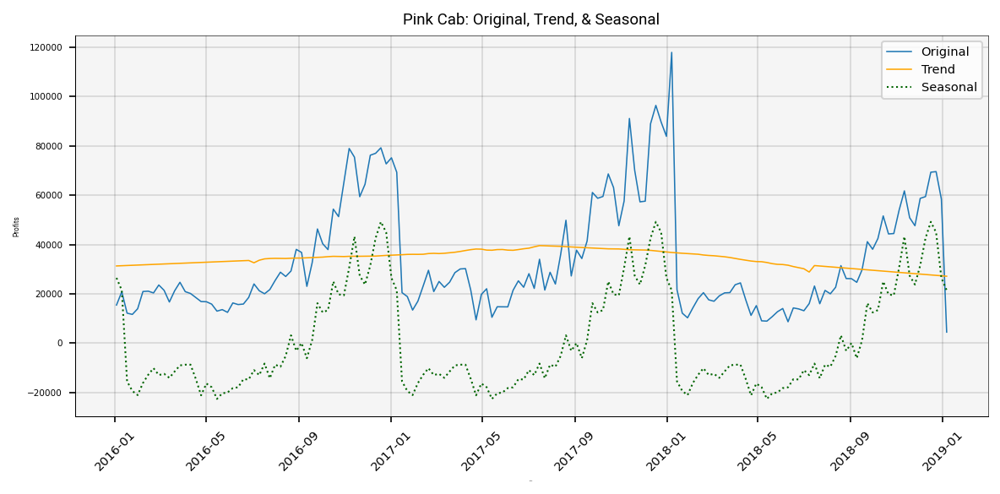

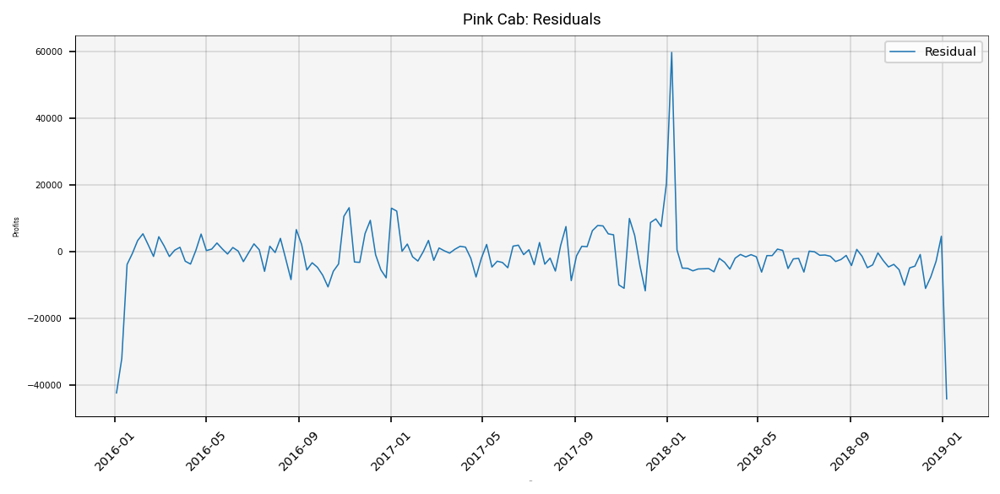

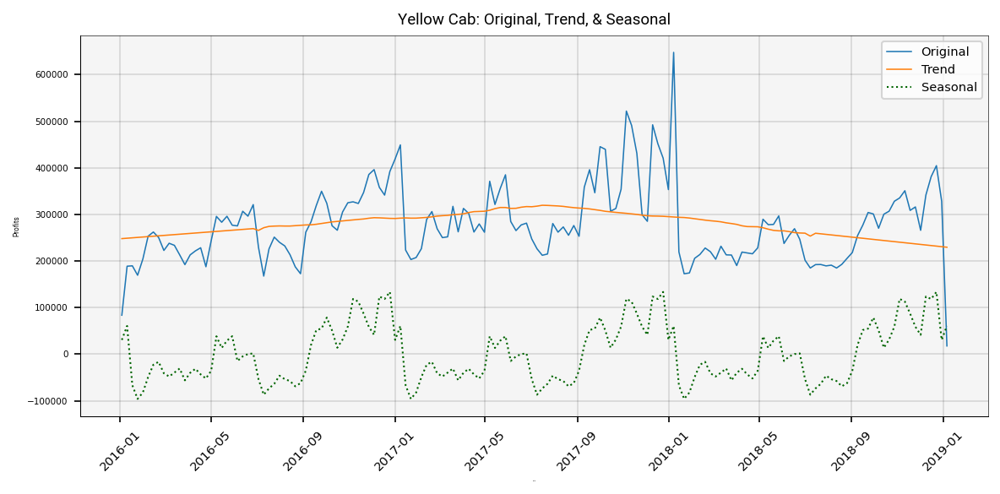

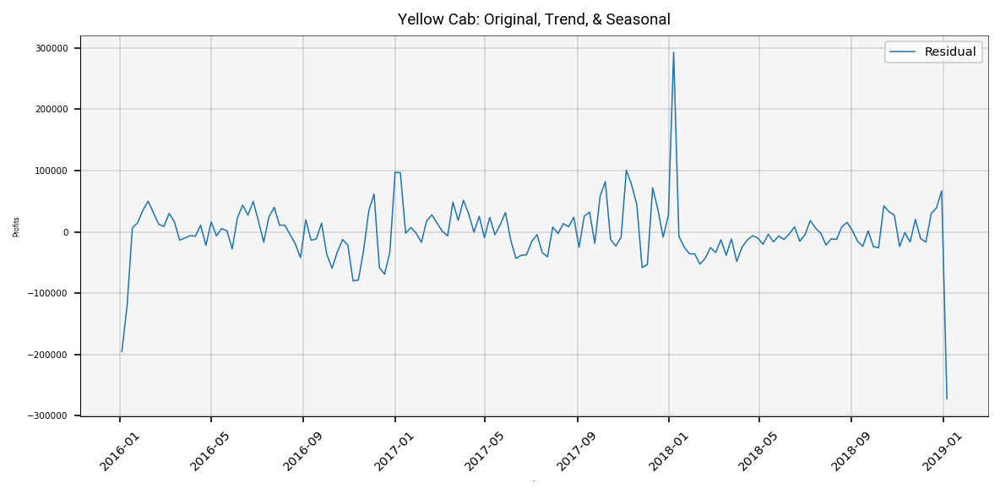

In [81]:

# ## > Pink seasonal decomposition

fig3, ax3 = plt.subplots(figsize=(8, 4), dpi=150)



ax3.plot(pprofits, label='Original', linewidth=.75)
ax3.plot(pprofits.index, ptrend, label='Trend', linestyle='solid', linewidth=.75, color='orange')
ax3.plot(pprofits.index, pseasonal, label='Seasonal', linestyle='dotted', linewidth=1, color='darkgreen')
format_plot(pprofits, fig3, ax3, 'Date', 'Profits', 'Pink Cab: Original, Trend, & Seasonal')

fig4, ax4 = plt.subplots(figsize=(8, 4), dpi=150)

ax4.plot(pprofits.index, presiduals, label='Residual', linewidth=.75)
format_plot(pprofits, fig4, ax4, 'Date', 'Profits', 'Pink Cab: Residuals')

# ## > Yellow seasonal decomposition

fig5, ax5 = plt.subplots(figsize=(8, 4), dpi=150)

ax5.plot(yprofits, label='Original', linewidth=.75)
ax5.plot(yprofits.index, ytrend, label='Trend', linestyle='solid', linewidth=.75)
ax5.plot(yprofits.index, yseasonal, label='Seasonal', linestyle='dotted', linewidth=1, color='darkgreen')
format_plot(yprofits, fig5, ax5, 'Date', 'Profits', 'Yellow Cab: Original, Trend, & Seasonal')

fig6, ax6 = plt.subplots(figsize=(8, 4), dpi=150)

ax6.plot(yprofits.index, yresiduals, label='Residual', linewidth=.75)
format_plot(yprofits, fig6, ax6, 'Date', 'Profits', 'Yellow Cab: Original, Trend, & Seasonal')




## Estimating Pink Cab Trend Coefficients

In [82]:
# Add a constant term to the independent variable (trend)
X = sm.add_constant(ptrend)

# Fit a linear regression model
model = sm.OLS(pprofits, X)
results = model.fit()

# Get the regression coefficients
intercept, slope = results.params

# Print the coefficients
print("Intercept:", intercept)
print("Slope (Coefficient):", slope, '\n')

# R-squared
print(f'R-Squared: {results.rsquared} ')

Intercept: 74.27790462041094
Slope (Coefficient): 0.9770054376728654 

R-Squared: 0.019667358849381422 


A, B, C = [-1.56745539e+00  2.26683728e+02  2.94303202e+04]

R-squared: 0.8969648915122493


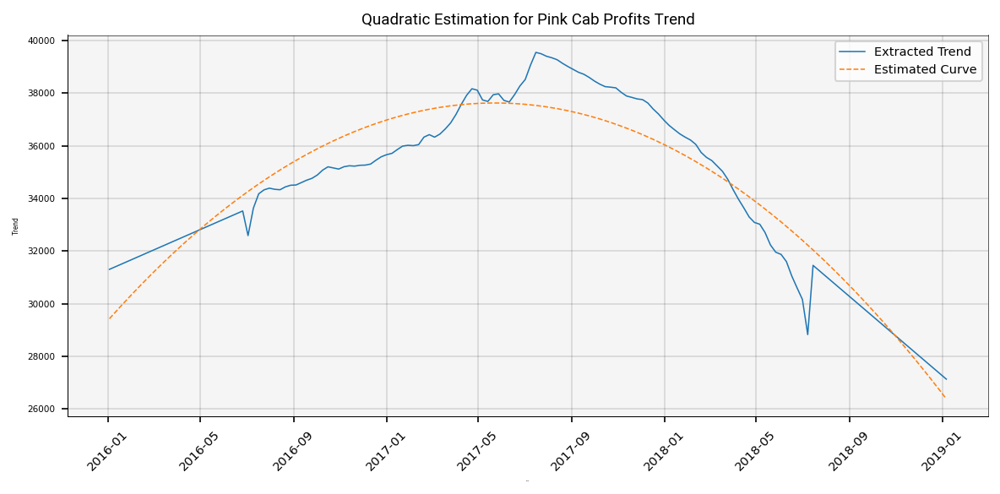

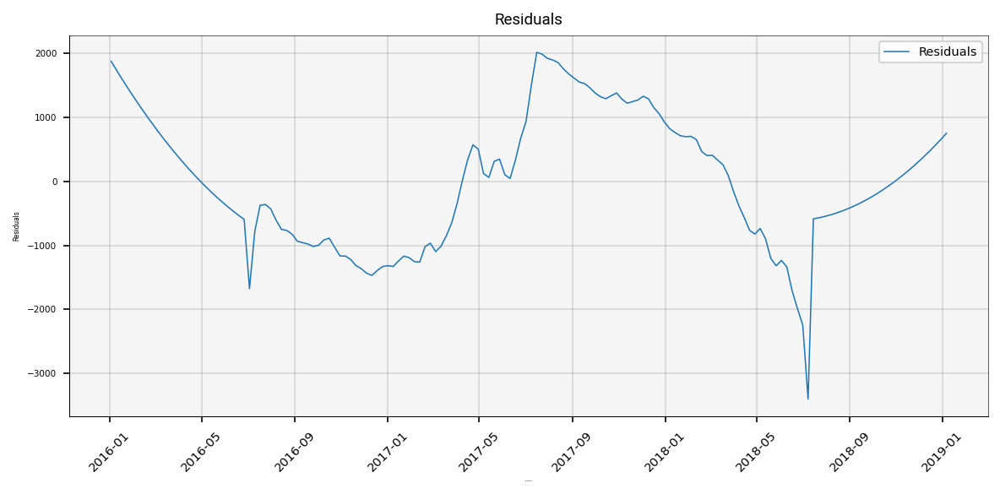

In [83]:
from scipy.optimize import curve_fit

# Convert DatetimeIndex to numerical values
x_values = np.arange(len(ptrend))


# Define the quadratic function
def quadratic_func(x, a, b, c):
    return a * x**2 + b * x + c

# Fit the quadratic function to the numerical x_values using scipy.optimize.curve_fit
params, _= curve_fit(quadratic_func, x_values, ptrend)

# Generate the values of the quadratic curve
quadratic_curve = quadratic_func(x_values, *params)

# Calculate residuals (differences between original data and fitted curve)
pquad_resid = ptrend - quadratic_curve


# Plot the original data and the quadratic curve
fig6, ax6 = plt.subplots(figsize=(8, 4), dpi=150)

ax6.plot(ptrend.index, ptrend, label='Extracted Trend', linewidth=.75)
ax6.plot(ptrend.index, quadratic_curve, label='Estimated Curve', linestyle='dashed', linewidth=.75)
format_plot(ptrend, fig6, ax6, 'Date', 'Trend', 'Quadratic Estimation for Pink Cab Profits Trend')

print(f'A, B, C = {params}')

fig7, ax7 = plt.subplots(figsize=(8, 4), dpi=150)


plt.plot(ptrend.index, pquad_resid, label='Residuals', linewidth=.75)
format_plot(ptrend, fig7, ax7, 'Residuals', 'Residuals', 'Residuals')


# Calculate R-Squared value
sst = np.sum((ptrend - np.mean(ptrend))**2)
ssr = np.sum(pquad_resid**2)
r_squared = 1 - (ssr / sst)
print("\nR-squared:", r_squared)


## Estimating Yellow Cab Trend Coefficients

In [84]:
# Add a constant term to the independent variable (trend)
X = sm.add_constant(ytrend)

# Fit a linear regression model
model = sm.OLS(yprofits, X)
results = model.fit()

# Get the regression coefficients
intercept, slope = results.params

# Print the coefficients
print("Intercept:", intercept)
print("Slope (Coefficient):", slope, '\n')

# R-squared
print(f'R-Squared: {results.rsquared} ')


Intercept: -4625.07629115149
Slope (Coefficient): 1.015068177737436 

R-Squared: 0.08846372701925487 


A, B, C = [-1.22501789e+01  1.83046549e+03  2.36311110e+05]
R-squared: 0.9993092410489578


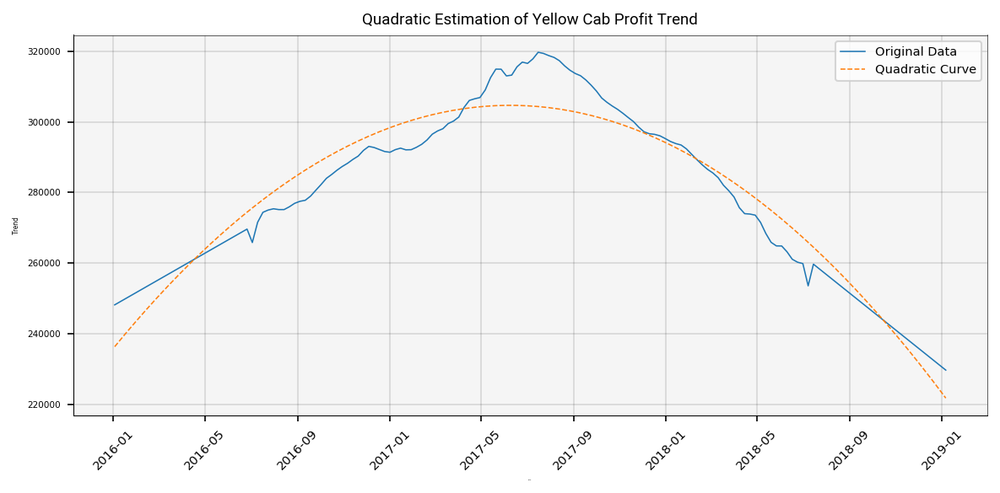

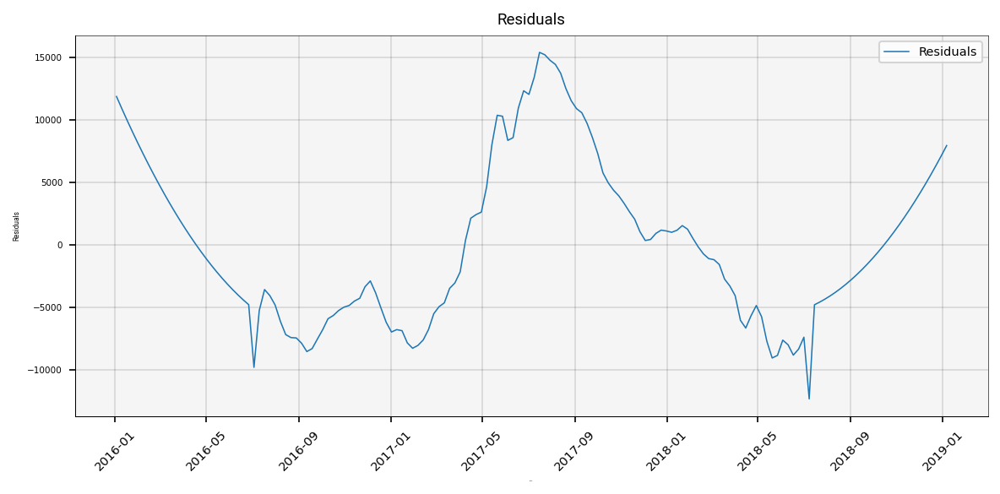

In [85]:
from scipy.optimize import curve_fit

# Convert DatetimeIndex to numerical values
x_values = np.arange(len(ytrend))


# Define the quadratic function
def quadratic_func(x, a, b, c):
    return a * x**2 + b * x + c

# Fit the quadratic function to the numerical x_values using scipy.optimize.curve_fit
params, _= curve_fit(quadratic_func, x_values, ytrend)

# Generate the values of the quadratic curve
quadratic_curve = quadratic_func(x_values, *params)

# Calculate residuals (differences between ytrend data and fitted curve)
yquad_resid = ytrend - quadratic_curve


# Create figure
fig8, ax8 = plt.subplots(figsize=(8, 4), dpi=150)


plt.plot(ytrend.index, ytrend, label='Original Data', linewidth=.75)
plt.plot(ytrend.index, quadratic_curve, label='Quadratic Curve', linestyle='dashed', linewidth=.75)
format_plot(ytrend, fig8, ax8, 'Date', 'Trend', 'Quadratic Estimation of Yellow Cab Profit Trend')

# Print parameters
print(f'A, B, C = {params}')

fig9, ax9 = plt.subplots(figsize=(8, 4), dpi=150)

# Plot the residuals from the curve fitting
plt.plot(ytrend.index, yquad_resid, label='Residuals', linewidth=.75)
format_plot(ytrend, fig9, ax9, 'Date', 'Residuals', 'Residuals')

# Calculate R-Squared value
sst = np.sum((ytrend - np.mean(ptrend))**2)
ssr = np.sum(yquad_resid**2)
r_squared = 1 - (ssr / sst)
print("R-squared:", r_squared)

# Stationarity

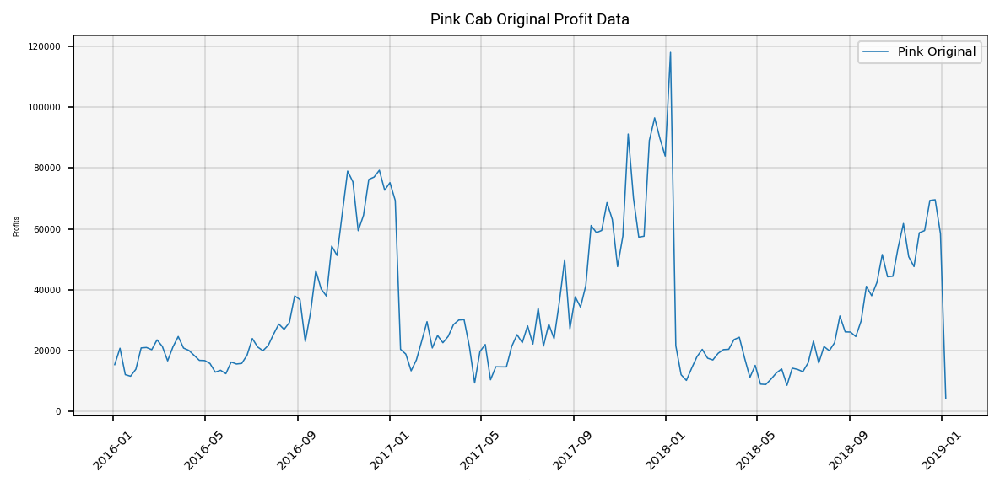

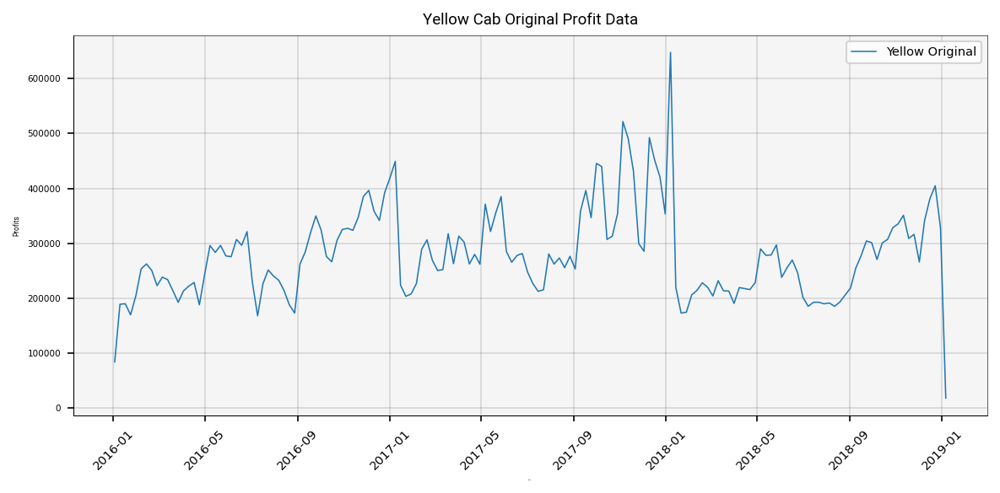

In [86]:
# Plot figure
fig10, ax10 = plt.subplots(figsize=(8, 4), dpi=150)

# Plot original data
plt.plot(pprofits, label='Pink Original', linewidth=.75)
format_plot(pprofits, fig10, ax10, 'Date', 'Profits', 'Pink Cab Original Profit Data')

fig11, ax11 = plt.subplots(figsize=(8, 4), dpi=150)
plt.plot(yprofits, label='Yellow Original', linewidth=.75)
format_plot(yprofits, fig11, ax11, 'Date', 'Profits', 'Yellow Cab Original Profit Data')

## Pink Cab Stationarity: First Order & Seasonal Differencing, & ADF Test

In [87]:
# Fit the rolling mean & standard deviations
window_size = 12

pmove_avg = pprofits.rolling(window=window_size, min_periods=1).mean()
pmove_std = pprofits.rolling(window=window_size, min_periods=1).std()

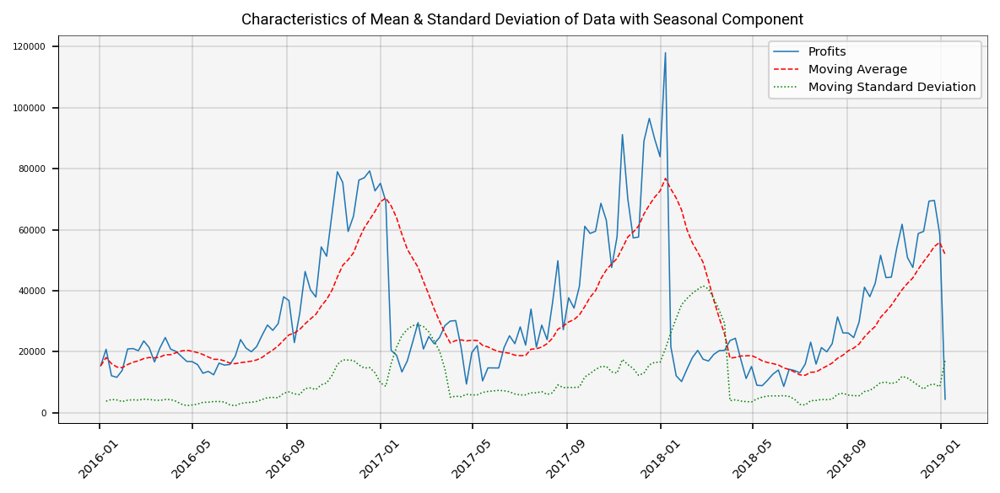

In [88]:
fig12, ax12 = plt.subplots(figsize=(8, 4), dpi=150)

plt.plot(pprofits, label='Profits', linewidth=.75)
plt.plot(pprofits.index, pmove_avg, label='Moving Average', linestyle='dashed', color='red', linewidth=.75)
plt.plot(pprofits.index, pmove_std, label='Moving Standard Deviation', linestyle='dotted', color='green', linewidth=.75)
format_plot(pprofits, fig12, ax12, '', '', 'Characteristics of Mean & Standard Deviation of Data with Seasonal Component')


In [89]:
len(pprofits)
len(yprofits)

158

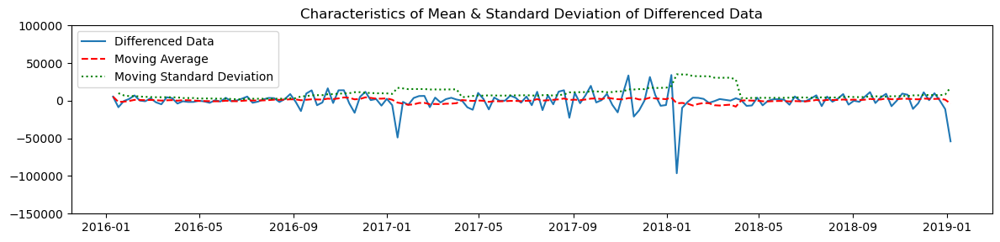

In [90]:
# Take the first difference to remove any trend component
pprofits_diff = pprofits.diff().dropna()

# Take 52-week difference to remove the seasonal component
#pprofits_diff = pprofits_diff.diff(52).dropna()

# Fit the rolling avg & std
pmove_avg = pprofits_diff.rolling(window=window_size, min_periods=1).mean()
pmove_std = pprofits_diff.rolling(window=window_size, min_periods=1).std()

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
plt.plot(pprofits_diff, label='Differenced Data')
plt.ylim(-150000, 100000)
plt.plot(pprofits_diff.index, pmove_avg, label='Moving Average', linestyle='dashed', color='red')
plt.plot(pprofits_diff.index, pmove_std, label='Moving Standard Deviation', linestyle='dotted', color='green')
plt.title('Characteristics of Mean & Standard Deviation of Differenced Data')
plt.tight_layout()
plt.legend()


In [91]:
# Perform Adfuller ADF test for stationarity

# H0: has a unit root, non-stationary
# Ha: no unit root, is stationary (trend stationary)

adf_test1 = adfuller(pprofits_diff)

print('\nADF Statistic:', adf_test1[0])
print('p-value:', adf_test1[1], '\n')
print('Reject the null, data is stationary for weekly pink cab data\n ')




ADF Statistic: -9.955501029382454
p-value: 2.450411918820418e-17 

Reject the null, data is stationary for weekly pink cab data
 


## Pink Cab Profit Forecast: Seasonal ARIMA

In [92]:
# Aggregate data
profit_series = mdf.groupby('company')['profit'].resample('W').sum()
profit_df = profit_series.unstack(level='company')

# Separate individual series for easier coding and identification
pprofits = profit_df['pink cab']
yprofits = profit_df['yellow cab']


In [93]:
forecast1=None
del forecast1

transformer1=None
del transformer1

forecast=None
del forecast

transformer=None
del transformer

In [94]:
from scalecast.Forecaster import Forecaster
from scalecast.SeriesTransformer import SeriesTransformer


# Create forecast object
forecast1 = Forecaster(
    current_dates = pprofits.index,
    y = pprofits,
    future_dates = 104,
)


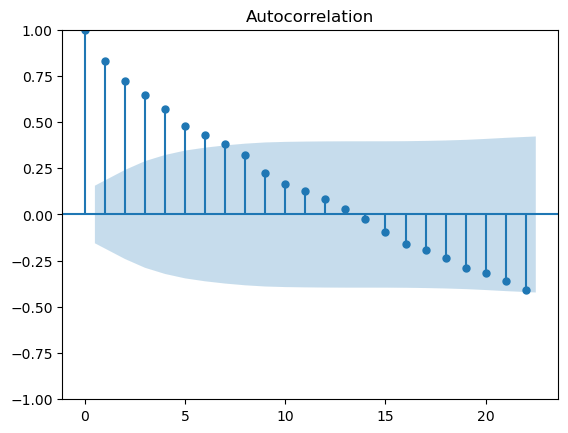

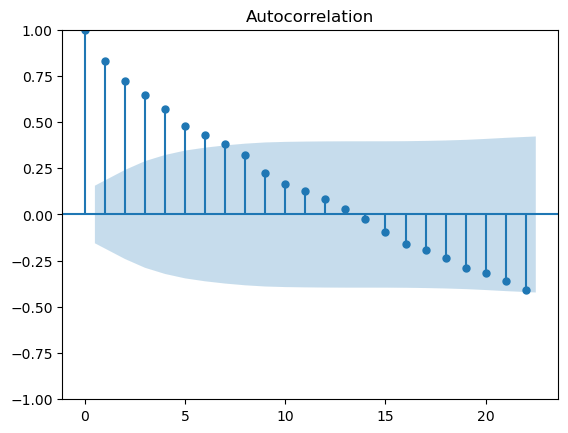

In [95]:
# Plot the ACF
forecast1.plot_acf()

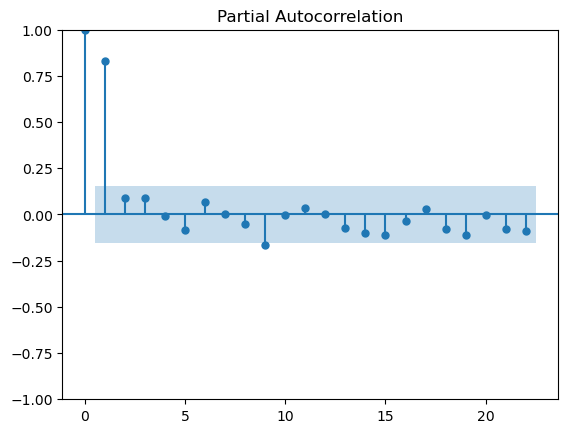

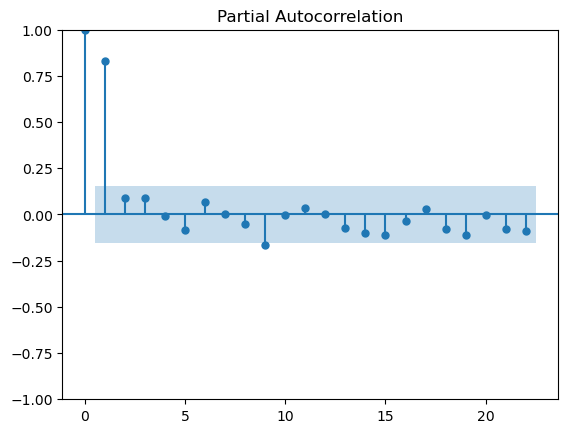

In [96]:
# Plot the PACF
forecast1.plot_pacf(method='ywm')

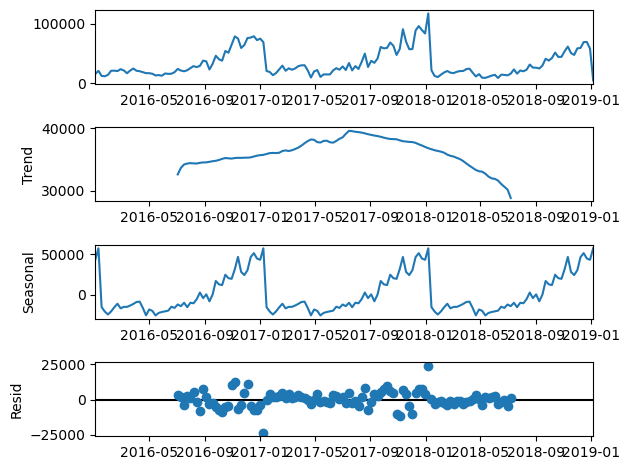

In [97]:
forecast1.seasonal_decompose().plot()
plt.show()

In [98]:
# Create a transformer object
transformer1 = SeriesTransformer(forecast1)
forecast1 = transformer1.DiffTransform(52) 
forecast1 = transformer1.DetrendTransform()

<AxesSubplot: xlabel='Date', ylabel='Values'>

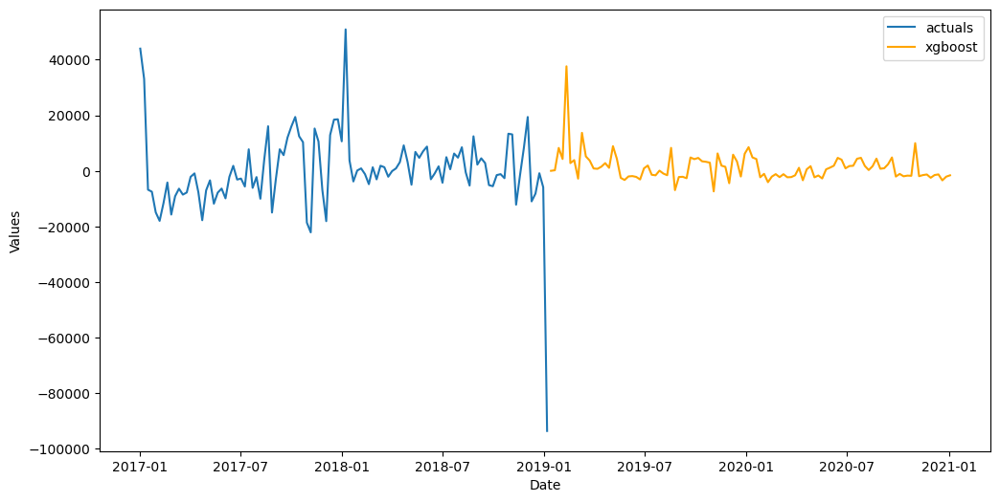

In [99]:
forecast1.set_estimator('xgboost')
forecast1.add_ar_terms(52)
forecast1.manual_forecast(n_estimators=100, gamma=2)
forecast1.plot()

In [100]:
forecast1 = transformer1.DetrendRevert()
forecast1 = transformer1.DiffRevert(52)


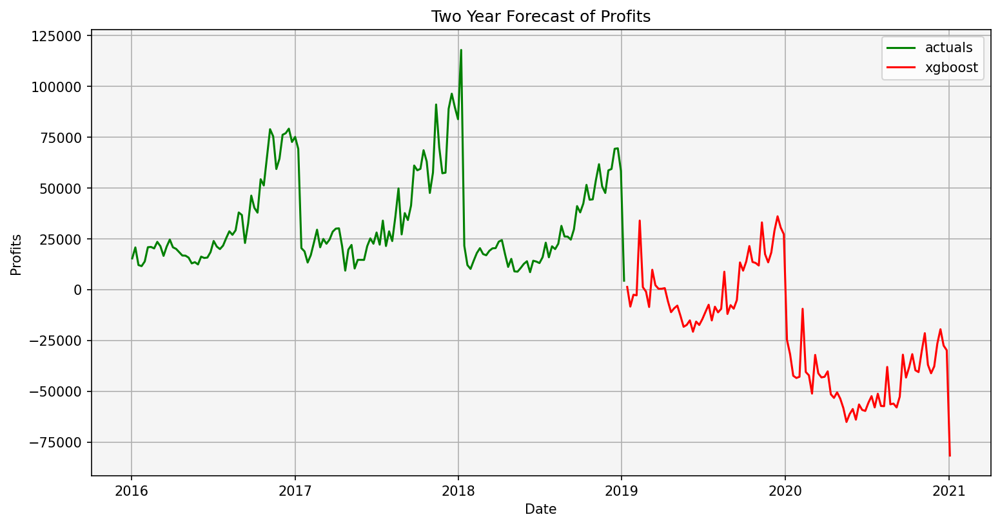

In [101]:
forecast1_plot = forecast1.plot()
forecast1_plot.set(xlabel='Date', ylabel='Profits', title='Two Year Forecast of Profits')


# Modify the size of the axis and figure
#forecast1_plot.get_figure().set_facecolor('lightblue') 
forecast1_plot.set_facecolor('whitesmoke')  
forecast1_plot.grid(True)
legend = forecast1_plot.legend()

# Set DPI (dots per inch)
forecast1_plot.get_figure().set_dpi(150)

# Change the color of profit lines
for line in forecast1_plot.get_lines():
    if line.get_label() == 'actuals':
        line.set_color('green')  # Change color of the 'Actual' line
    elif line.get_label() == 'xgboost':
        line.set_color('red')  # Change color of the 'Forecast' line
        
# Change the color of legend markers to match the line colors
for line, handle in zip(forecast1_plot.get_lines(), legend.legendHandles):
    handle.set_color(line.get_color())
    
# Show the modified chart
plt.show()

In [102]:
list_mpl_colors()

aliceblue: #F0F8FF
antiquewhite: #FAEBD7
aqua: #00FFFF
aquamarine: #7FFFD4
azure: #F0FFFF
beige: #F5F5DC
bisque: #FFE4C4
black: #000000
blanchedalmond: #FFEBCD
blue: #0000FF
blueviolet: #8A2BE2
brown: #A52A2A
burlywood: #DEB887
cadetblue: #5F9EA0
chartreuse: #7FFF00
chocolate: #D2691E
coral: #FF7F50
cornflowerblue: #6495ED
cornsilk: #FFF8DC
crimson: #DC143C
cyan: #00FFFF
darkblue: #00008B
darkcyan: #008B8B
darkgoldenrod: #B8860B
darkgray: #A9A9A9
darkgreen: #006400
darkgrey: #A9A9A9
darkkhaki: #BDB76B
darkmagenta: #8B008B
darkolivegreen: #556B2F
darkorange: #FF8C00
darkorchid: #9932CC
darkred: #8B0000
darksalmon: #E9967A
darkseagreen: #8FBC8F
darkslateblue: #483D8B
darkslategray: #2F4F4F
darkslategrey: #2F4F4F
darkturquoise: #00CED1
darkviolet: #9400D3
deeppink: #FF1493
deepskyblue: #00BFFF
dimgray: #696969
dimgrey: #696969
dodgerblue: #1E90FF
firebrick: #B22222
floralwhite: #FFFAF0
forestgreen: #228B22
fuchsia: #FF00FF
gainsboro: #DCDCDC
ghostwhite: #F8F8FF
gold: #FFD700
goldenrod: #D

## Yellow Cab Stationarity: First Order & Seasonal Differencing, & ADF Test

In [103]:
# Fit the rolling mean & standard deviations

ymove_avg = yprofits.rolling(window=window_size, min_periods=1).mean()
ymove_std = yprofits.rolling(window=window_size, min_periods=1).std()

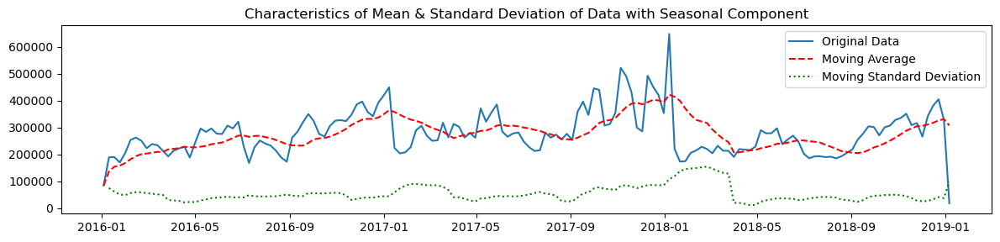

In [104]:
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
plt.plot(yprofits, label='Original Data')
plt.plot(yprofits.index, ymove_avg, label='Moving Average', linestyle='dashed', color='red')
plt.plot(yprofits.index, ymove_std, label='Moving Standard Deviation', linestyle='dotted', color='green')
plt.title('Characteristics of Mean & Standard Deviation of Data with Seasonal Component')
plt.tight_layout()
plt.legend()

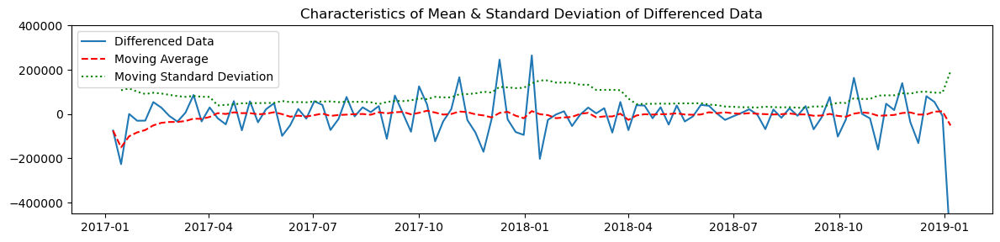

In [105]:
# Take the first difference of Yellow Cab data
yprofits_diff = yprofits.diff().dropna()

# Takd the 52-week seasonal difference to remove the seasonal component
yprofits_diff = yprofits_diff.diff(52).dropna()

# Fit the rolling avg & std
ymove_avg = yprofits_diff.rolling(window=window_size, min_periods=1).mean()
ymove_std = yprofits_diff.rolling(window=window_size, min_periods=1).std()

plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
plt.plot(yprofits_diff, label='Differenced Data')
plt.ylim(-450000, 400000)
plt.plot(yprofits_diff.index, ymove_avg, label='Moving Average', linestyle='dashed', color='red')
plt.plot(yprofits_diff.index, ymove_std, label='Moving Standard Deviation', linestyle='dotted', color='green')
plt.title('Characteristics of Mean & Standard Deviation of Differenced Data')
plt.tight_layout()
plt.legend()


In [106]:
# Perform Adfuller ADF test for stationarity

# H0: has a unit root, non-stationary
# Ha: no unit root, is stationary (trend stationary)

adf_test1 = adfuller(yprofits_diff)

print('\nADF Statistic:', adf_test1[0])
print('p-value:', adf_test1[1], '\n')
print('Reject the null, data is stationary for weekly yellow cab data\n ')



ADF Statistic: -5.0672879206801085
p-value: 1.630520890415833e-05 

Reject the null, data is stationary for weekly yellow cab data
 


## Yellow Cab Profit Forecast: Seasonal ARIMA 

In [107]:
# Aggregate data
profit_series = mdf.groupby('company')['profit'].resample('W').sum()
profit_df = profit_series.unstack(level='company')

# Separate individual series for easier coding and identification
pprofits = profit_df['pink cab']
yprofits = profit_df['yellow cab']


In [108]:
forecast2=None
del forecast2

transformer2=None
del transformer2

In [109]:
from scalecast.Forecaster import Forecaster
from scalecast.SeriesTransformer import SeriesTransformer


# Create forecast object
forecast2 = Forecaster(
    current_dates = yprofits.index,
    y = yprofits,
    future_dates = 104,
)


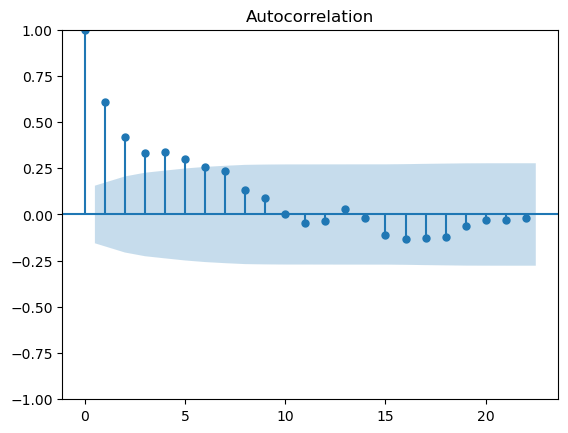

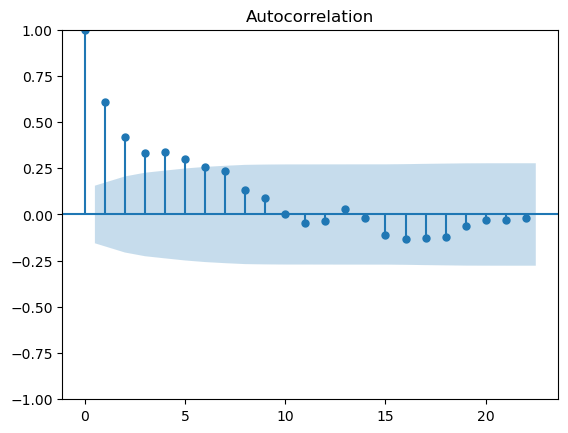

In [110]:
# Plot the ACF
forecast2.plot_acf()

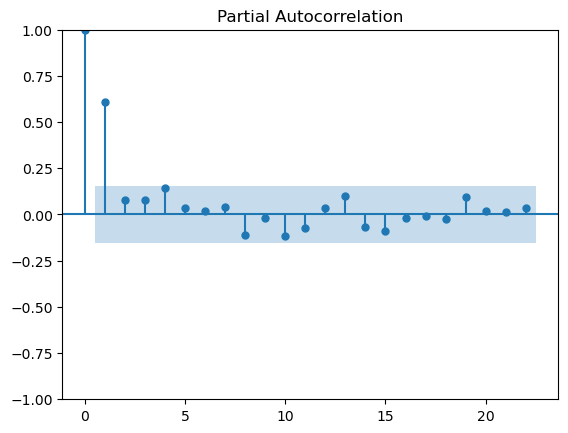

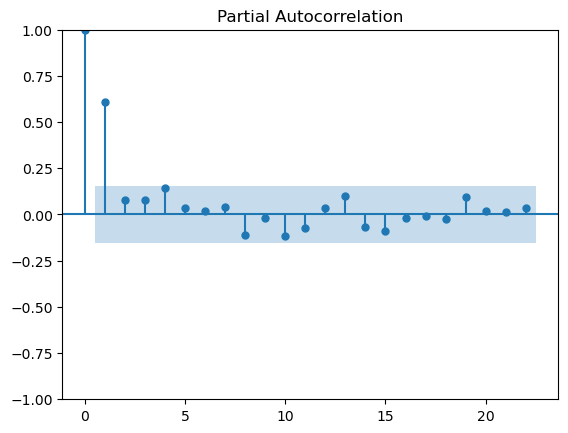

In [111]:
# Plot the PACF
forecast2.plot_pacf(method='ywm')

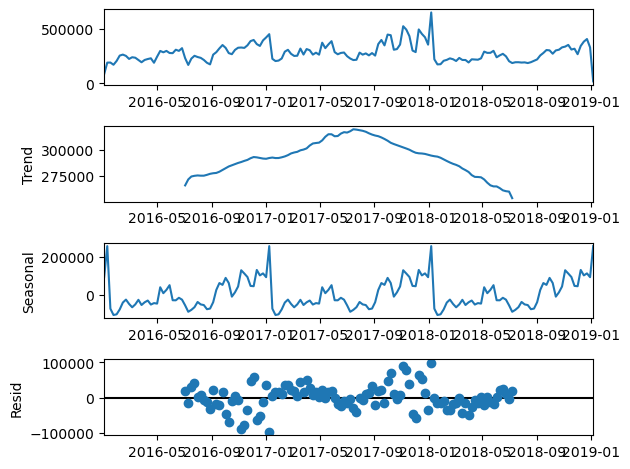

In [112]:
forecast2.seasonal_decompose().plot()
plt.show()

In [113]:
# Create a transformer object
transformer2 = SeriesTransformer(forecast2)
forecast2 = transformer2.DiffTransform(52) 
forecast2 = transformer2.DetrendTransform()

In [114]:
forecast2.set_estimator('xgboost')
forecast2.add_ar_terms(52)
forecast2.manual_forecast(n_estimators=100, gamma=2)


In [115]:
forecast2 = transformer2.DetrendRevert()
forecast2 = transformer2.DiffRevert(52)


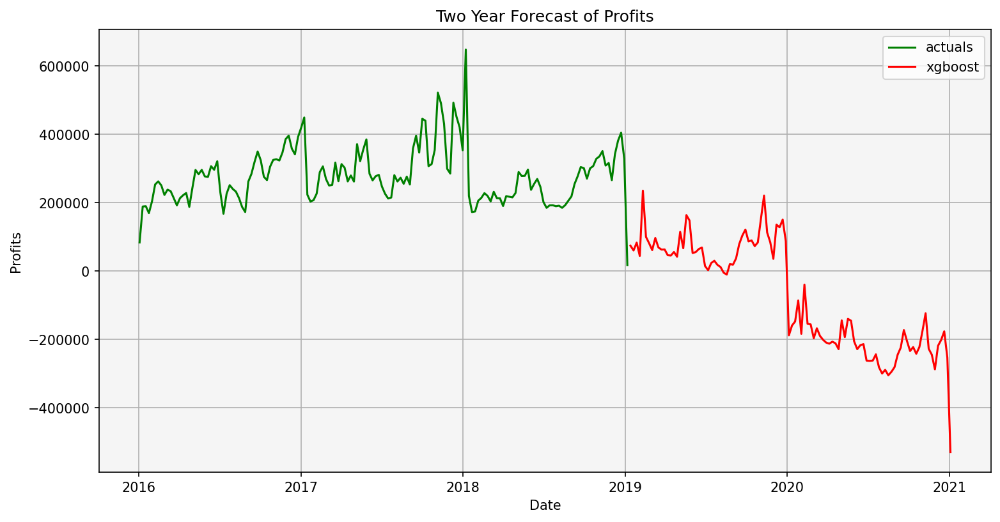

In [116]:
forecast2_plot = forecast2.plot()
forecast2_plot.set(xlabel='Date', ylabel='Profits', title='Two Year Forecast of Profits')


# Modify the size of the axis and figure
#forecast2_plot.get_figure().set_facecolor('lightblue') 
forecast2_plot.set_facecolor('whitesmoke')  
forecast2_plot.grid(True)
legend = forecast2_plot.legend()

# Set DPI (dots per inch)
forecast2_plot.get_figure().set_dpi(150)

# Change the color of profit lines
for line in forecast2_plot.get_lines():
    if line.get_label() == 'actuals':
        line.set_color('green')  # Change color of the 'Actual' line
    elif line.get_label() == 'xgboost':
        line.set_color('red')  # Change color of the 'Forecast' line
        
# Change the color of legend markers to match the line colors
for line, handle in zip(forecast2_plot.get_lines(), legend.legendHandles):
    handle.set_color(line.get_color())
    
# Show the modified chart
plt.show()

# Revenue

In [117]:
from matplotlib.ticker import FuncFormatter

def format_plot(fig, ax, title):
    # Define the custom y-axis tick locations and labels
    custom_ticks = [1e6, 1e7]
    custom_labels = ['$1M', '$10M']

    # Apply the custom tick formatting function to the y-axis
    plt.gca().yaxis.set_major_formatter(FuncFormatter(format_y_ticks))

    # Set font size
    plt.yticks(fontsize=5)

    # Set labels and title
    ax.set_ylabel('Revenue', fontproperties=roboto, fontsize=5)
    ax.set_title(f'Company Revenue by {title}', fontproperties=roboto, fontsize=7)

    # Hide the right and top spines
#     ax.spines['right'].set_visible(False)
#     ax.spines['top'].set_visible(False)

    ax.spines['left'].set_linewidth(.5)
    # Add legend
    ax.legend(bbox_to_anchor=(1, 1), prop={'size': 5})

    # Set ax facecolor
    ax = plt.gca()
    ax.set_facecolor('whitesmoke')

    # Set the figure face color
    # Get the current Figure object
    fig = plt.gcf()

    # Set the background color of the figure
    #fig.set_facecolor('lightgray') 

    # Set the color of the plot perimeter (spines)
    perimeter_color = 'black'  # Set the desired perimeter color
    ax.spines['top'].set_color(perimeter_color)
    ax.spines['right'].set_color(perimeter_color)
    ax.spines['bottom'].set_color(perimeter_color)
    ax.spines['left'].set_color(perimeter_color)

    # Display the plot
    plt.tight_layout()
    plt.grid(True, linewidth=.1, color='black')
    plt.tight_layout()
    plt.show()

In [118]:
# Function to format the y-axis tick labels
def format_y_ticks(value, ax):
    custom_ticks = [1e6, 1e7]
    custom_labels = ['$1M', '$10M']
    if value in custom_ticks:
        return custom_labels[custom_ticks.index(value)]
    else:
        return f"${value:.0f}"

In [119]:
# Function that plots grouped bar charts
def plot_bars(df, fig, ax, companies, level, barwidth):
    colors = ['pink', 'yellow']
    # Plot bars for each company
    width = barwidth  
    for i, company in enumerate(companies):
        grp_revenue_company = df.xs(company, level='company')
        x = range(len(grp_revenue_company))
        x_shifted = [val + i * width for val in x]
        ax.bar(x_shifted, grp_revenue_company['price'], width=width, label=company, log=True, 
               zorder=4, color=colors[i], edgecolor='black', linewidth=.3, alpha=.9)

    # Set x-axis labels and ticks
    ax.set_xticks([val + width * (len(companies) - 1) / 2 for val in x])
    ax.set_xticklabels(grp_revenue_company.index.get_level_values(level), rotation=45, ha='right', fontproperties=roboto,
                       fontsize=6)

## Revenues By State

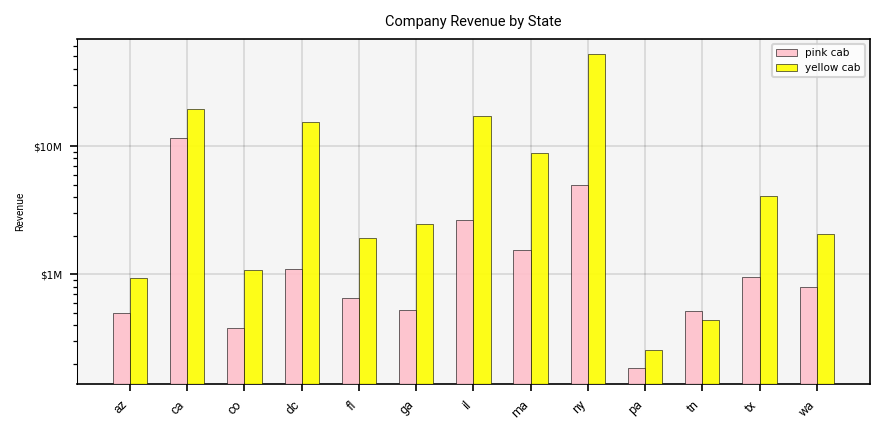

In [120]:
# Group data according to company by state
state_revenue = mdf.groupby(['company', 'state']).agg({'price':'sum'})

# Extract unique companies for legend
companies = state_revenue.index.get_level_values('company').unique()

# Create a figure and axis
fig1, ax1 = plt.subplots(figsize=(6, 3), dpi=150)

# Plot bars
plot_bars(state_revenue, fig1, ax1, companies, 'state', 0.3)

# Format plot
format_plot(fig1, ax1, 'State')


## Revenues By City

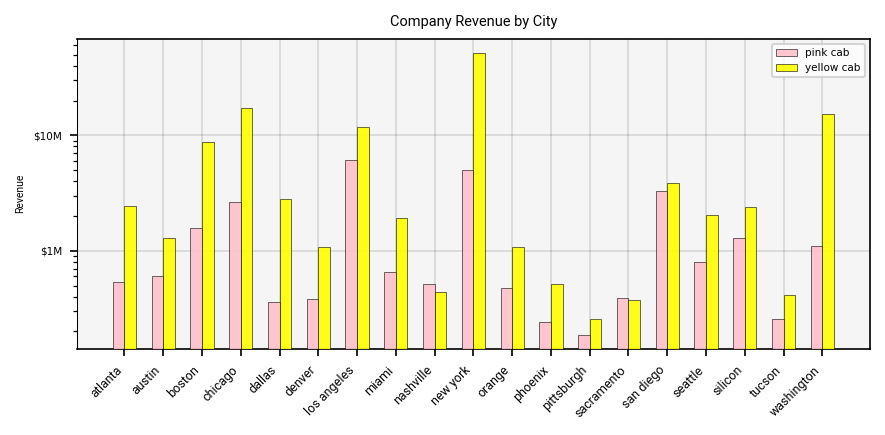

In [121]:

# Group data according to company by city
city_revenue = mdf.groupby(['company', 'city']).agg({'price':'sum'})

# Extract unique companies for legend
companies = city_revenue.index.get_level_values('company').unique()

# Create a figure and axis
fig2, ax2 = plt.subplots(figsize=(6, 3), dpi=150)

# Plot bars
plot_bars(city_revenue, fig2, ax2, companies, 'city', 0.3)

# Format plot
format_plot(fig2, ax2, 'City')



In [122]:
colorz = ['#6b4469','#cdbef6','#de5a64','#96defb','#5daf34','#437a70','#1adeef','#c6731d',
          '#ff8797','#044d10','#aa3885','#a1dddb','#3b6021','#b3274f','#14373c','#68ddf0',
          '#25c364','#48bb7a','#8fd45b','#c2deb9','#ca5f53','#71b811','#ebc0d9','#4e7bdc',
          '#7afa0a','#87698c']

def visualize(data, feature, target, colors):
    # Create the figure and axes
    fig, ax = plt.subplots(figsize=(50, 15), dpi=150)
    
    # Plot the graph
    crosstab_result = pd.crosstab(data[feature], data[target], normalize=0)
    crosstab_result = crosstab_result.fillna(0)

    graph = crosstab_result.plot(
        kind='bar', color=colors, ax=ax, width=.5, align='center', edgecolor='black', zorder=4)
    
    # Add vertical lines between groups of brands
    for i in range(len(crosstab_result)):
        if i > 0:
            ax.axvline(x=i - 0.5, color='gray', linewidth=4, linestyle='--')
    
    # Adjust the spacing around the chart
    plt.subplots_adjust(left=0.1, right=0.95, top=0.9, bottom=0.1)
    
    # Adjust the size of the left y-axis tick labels
    ax.tick_params(axis='y', labelsize=15)
    ax.tick_params(axis='x', labelsize=15)
    
    # Adjust the left margin of the plot
    plt.margins(0.1)
    
    # Adjust the lineweights of the ax spines
    spines = ['left', 'top', 'right', 'bottom']
    for spine in spines:
        ax.spines[spine].set_linewidth(3)
    
    # Create a dictionary to map target values to colors
    color_dict = {label: colors[i % len(colors)] for i, label in enumerate(data[target].unique())}
    
    # Legend
    legend_labels = data[target].unique()
    legend_handles = [Patch(facecolor=color_dict[label], label=label) for label in legend_labels]
    plt.legend(
        handles=legend_handles,
        bbox_to_anchor=(0.5, 1.20),
        loc='upper center',
        ncol=11,
        borderaxespad=0.,
        borderpad=.5,
        prop={'size': 35}
    )
    
    # Set the x-axis label, and y-axis label
    ax.set_facecolor('whitesmoke')
    plt.xticks(rotation=-360, fontsize=30)
    plt.yticks(fontsize=30)
    plt.xlabel('COMPANY', fontsize=40, labelpad=30)
    plt.ylabel('% of FARES', fontsize=40, labelpad=20)
    plt.title('FARE FREQUENCY HISTOGRAMS', fontsize=30, pad=30)
    
    plt.grid(True)
    plt.show()

    return crosstab_result


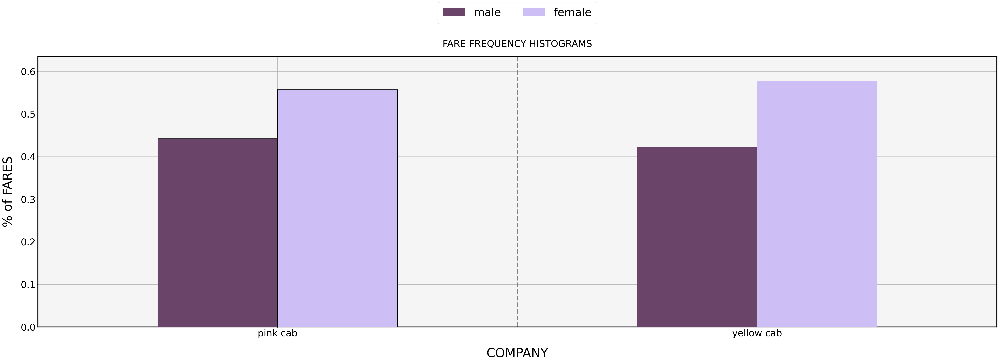

gender,female,male
company,,
pink cab,0.44,0.56
yellow cab,0.42,0.58


In [123]:
visualize(mdf, 'company', 'gender', colorz)

In [124]:

colorz = ['#6b4469', '#cdbef6', '#de5a64', '#96defb', '#5daf34', '#437a70', '#1adeef', '#c6731d',
          '#ff8797', '#044d10', '#aa3885', '#a1dddb', '#3b6021', '#b3274f', '#14373c', '#68ddf0',
          '#25c364', '#48bb7a', '#8fd45b', '#c2deb9', '#ca5f53', '#71b811', '#ebc0d9', '#4e7bdc',
          '#7afa0a', '#87698c', '#f7ce7b', '#b2d8e7', '#f18639', '#20b3a4', '#f4a8f8', '#9d532e',
          '#9e7f8e', '#1c898e', '#f9f76d', '#ce1e46', '#a4db3a', '#c67e7c', '#55decd', '#a6ac6a',
          '#285537', '#e6bbaa', '#478ab5', '#5c238b', '#4975cc', '#8f860e', '#d30a5d', '#779ab5']


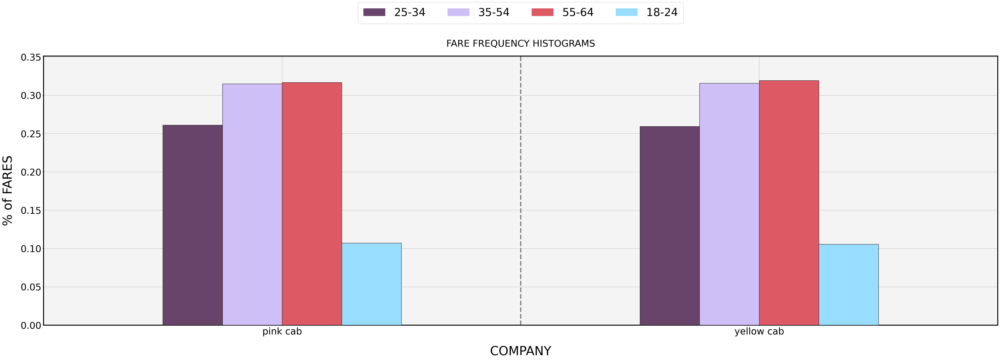

age,18-24,25-34,35-54,55-64
company,,,,
pink cab,0.26,0.31,0.32,0.11
yellow cab,0.26,0.32,0.32,0.11


In [125]:
visualize(mdf, 'company', 'age', colorz)

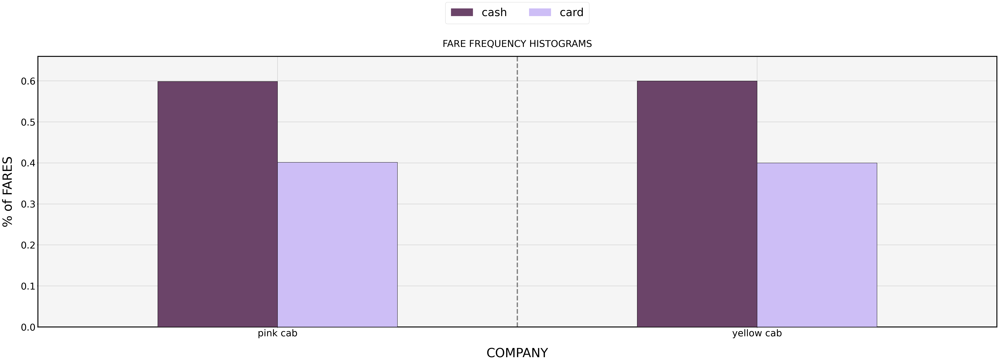

payment_type,card,cash
company,,
pink cab,0.60,0.40
yellow cab,0.60,0.40


In [126]:
visualize(mdf, 'company', 'payment_type', colorz)

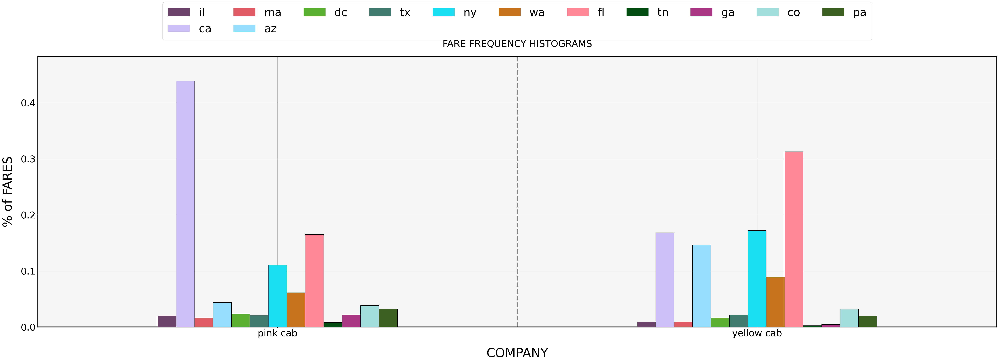

state,az,ca,co,dc,fl,ga,il,ma,ny,pa,tn,tx,wa
company,,,,,,,,,,,,,
pink cab,0.02,0.44,0.02,0.04,0.02,0.02,0.11,0.06,0.16,0.01,0.02,0.04,0.03
yellow cab,0.01,0.17,0.01,0.15,0.02,0.02,0.17,0.09,0.31,0.00,0.00,0.03,0.02


In [127]:
visualize(mdf, 'company', 'state', colorz)

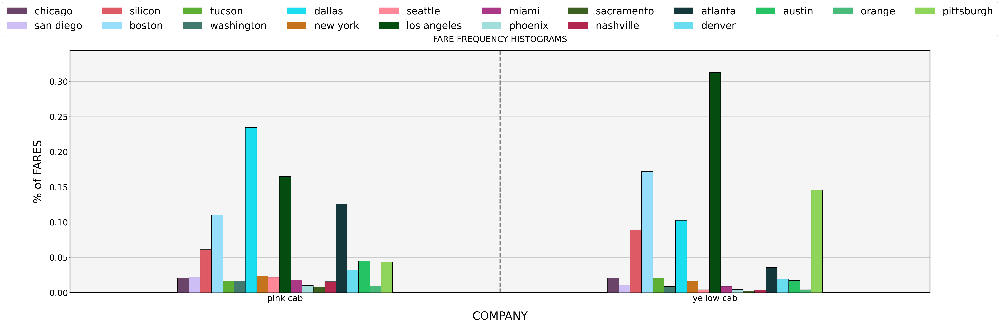

city,atlanta,austin,boston,chicago,dallas,denver,los angeles,miami,nashville,new york,orange,phoenix,pittsburgh,sacramento,san diego,seattle,silicon,tucson,washington
company,,,,,,,,,,,,,,,,,,,
pink cab,0.02,0.02,0.06,0.11,0.02,0.02,0.23,0.02,0.02,0.16,0.02,0.01,0.01,0.02,0.13,0.03,0.04,0.01,0.04
yellow cab,0.02,0.01,0.09,0.17,0.02,0.01,0.10,0.02,0.00,0.31,0.01,0.00,0.00,0.00,0.04,0.02,0.02,0.00,0.15


In [128]:
crosstab_result = visualize(mdf, 'company', 'city', colorz)
crosstab_result

In [129]:
# Transpose the 'ctab_results'
ctab = crosstab_result.T.reset_index()

# Merge the two DataFrames on the 'city' column
cdf = pd.merge(cdf, ctab, on='city')

# Create index 20 
cdf.loc[20] = ['san francisco', 629591, 213609, 0.34, 'ca', 0.00, 0.00]

# Sort by city
cdf.sort_values(by='city', inplace=True)

# Display
cdf

,city,pop,users,% of users,state,pink cab,yellow cab
0,atlanta,814885,24701,0.03,ga,0.02,0.02
1,austin,698371,14978,0.02,tx,0.02,0.01
2,boston,248968,80021,0.32,ma,0.06,0.09
3,chicago,1955130,164468,0.08,il,0.11,0.17
4,dallas,942908,22157,0.02,tx,0.02,0.02
5,denver,754233,12421,0.02,co,0.02,0.01
6,los angeles,1595037,144132,0.09,ca,0.23,0.10
7,miami,1339155,17675,0.01,fl,0.02,0.02
8,nashville,327225,9270,0.03,tn,0.02,0.00
9,new york,8405837,302149,0.04,ny,0.16,0.31


In [130]:
#Create a mapper
newcdf_names = {'% of users':'% of users in pop','pink cab':'pink mkt share', 'yellow cab':'yellow mkt share'}

cdf.rename(newcdf_names, axis=1, inplace=True)

# Create a total column
cdf['total mkt share'] = cdf['pink mkt share'] + cdf['yellow mkt share']

# Display
cdf

,city,pop,users,% of users in pop,state,pink mkt share,yellow mkt share,total mkt share
0,atlanta,814885,24701,0.03,ga,0.02,0.02,0.04
1,austin,698371,14978,0.02,tx,0.02,0.01,0.03
2,boston,248968,80021,0.32,ma,0.06,0.09,0.15
3,chicago,1955130,164468,0.08,il,0.11,0.17,0.28
4,dallas,942908,22157,0.02,tx,0.02,0.02,0.04
5,denver,754233,12421,0.02,co,0.02,0.01,0.03
6,los angeles,1595037,144132,0.09,ca,0.23,0.10,0.34
7,miami,1339155,17675,0.01,fl,0.02,0.02,0.04
8,nashville,327225,9270,0.03,tn,0.02,0.00,0.03
9,new york,8405837,302149,0.04,ny,0.16,0.31,0.48


## MrktShare & Profit Growth Rates: Yellow & Pink Cab Companies

In [131]:
def format_plot(data, fig, ax, xlab, ylab, title):
    
    # Set font size
    plt.yticks(fontsize=5)

    # Set labels and title
    ax.set_xlabel(xlab, fontproperties=roboto, fontsize=1)
    ax.set_ylabel(ylab, fontproperties=roboto, fontsize=4)
    ax.set_title(f'{title}', fontproperties=roboto, fontsize=9)

    ax.tick_params(axis='x', labelrotation=45, labelsize=7)

#     # Hide the right and top spines
#     ax.spines['right'].set_visible(False)
#     ax.spines['top'].set_visible(False)

    ax.spines['left'].set_linewidth(.5)
    ax.spines['bottom'].set_linewidth(.5)
    ax.spines['top'].set_linewidth(.3)
    ax.spines['right'].set_linewidth(.3)
    
    # Add legend
    ax.legend(bbox_to_anchor=(1, 1), prop={'size': 7})

    # Set ax facecolor
    #ax = plt.gca()
    fig.set_facecolor('whitesmoke')

    # Set the color of the plot perimeter (spines)
    perimeter_color = 'black'  
    ax.spines['top'].set_color(perimeter_color)
    ax.spines['right'].set_color(perimeter_color)
    ax.spines['bottom'].set_color(perimeter_color)
    ax.spines['left'].set_color(perimeter_color)

    # Display the plot
    plt.tight_layout()
    plt.grid(True, linewidth=.1, color='black')
    plt.tight_layout()
  

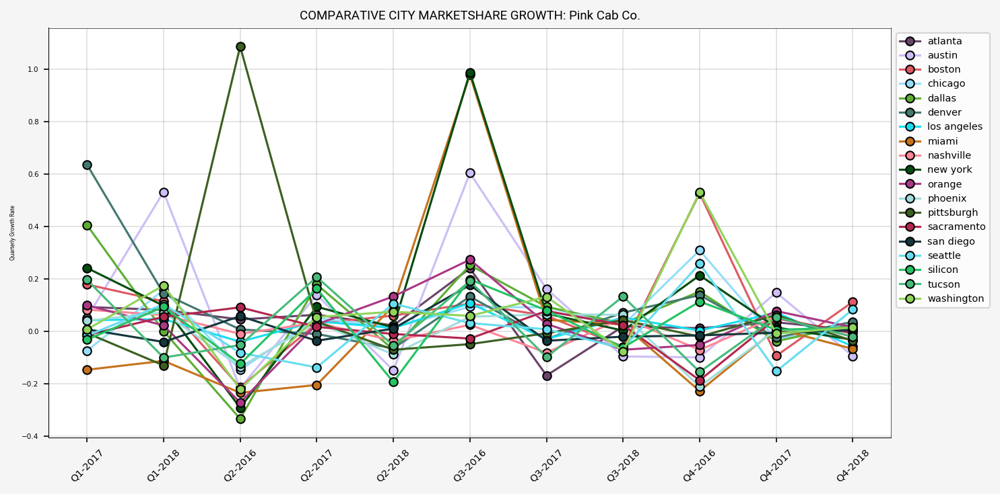

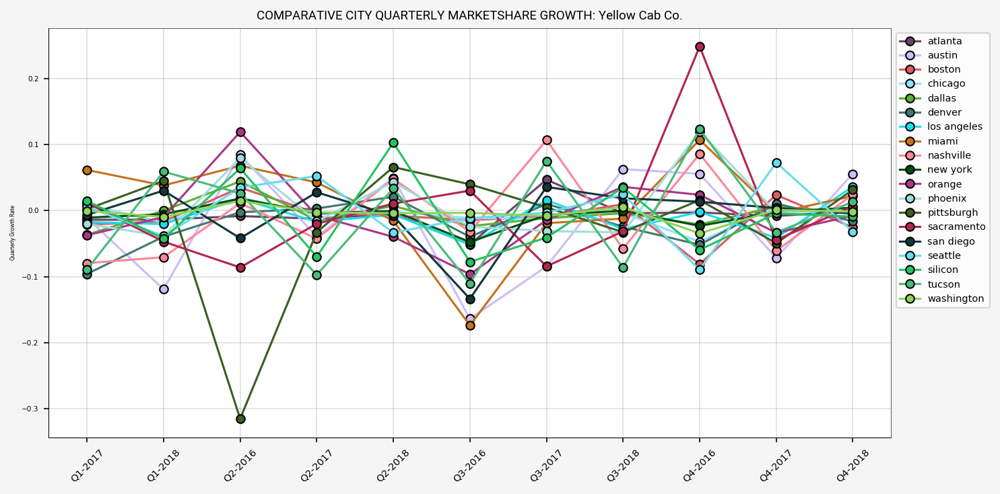

In [132]:

# Group the data
qrtrly_mrkt_share = mdf.groupby(['city', 'quarters', 'company'])['price'].sum() / mdf.groupby(['city', 'quarters'])['price'].sum()

# Create df to store the quarterly market share data for each city
cdf = qrtrly_mrkt_share.unstack(level='company').reset_index()

# Step 3: Calculate growth rates for each city and each cab company
cdf['pink growth_rate'] = cdf.groupby('city')['pink cab'].pct_change()
cdf['yellow growth_rate'] = cdf.groupby('city')['yellow cab'].pct_change()


# ## Visualize the quarter growth rates

fig13, ax13 = plt.subplots(figsize=(10, 5), dpi=150)

# Plot growth rates for pink cab
for i, (city, data) in enumerate(cdf.groupby('city')):
    plt.plot(data['quarters'], data['pink growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')

format_plot(cdf, fig13, ax13, '', 'Quarterly Growth Rate', 'COMPARATIVE CITY MARKETSHARE GROWTH: Pink Cab Co.')


# # Plot growth rates for yellow cab

fig14, ax14 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(cdf.groupby('city')):
    plt.plot(data['quarters'], data['yellow growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')

format_plot(cdf, fig14, ax14, '', 'Quarterly Growth Rate', 'COMPARATIVE CITY QUARTERLY MARKETSHARE GROWTH: Yellow Cab Co.')



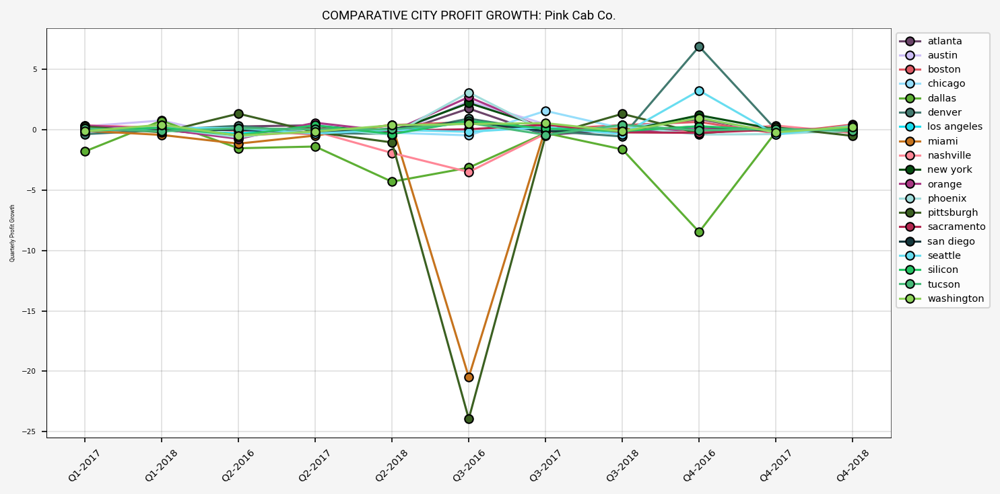

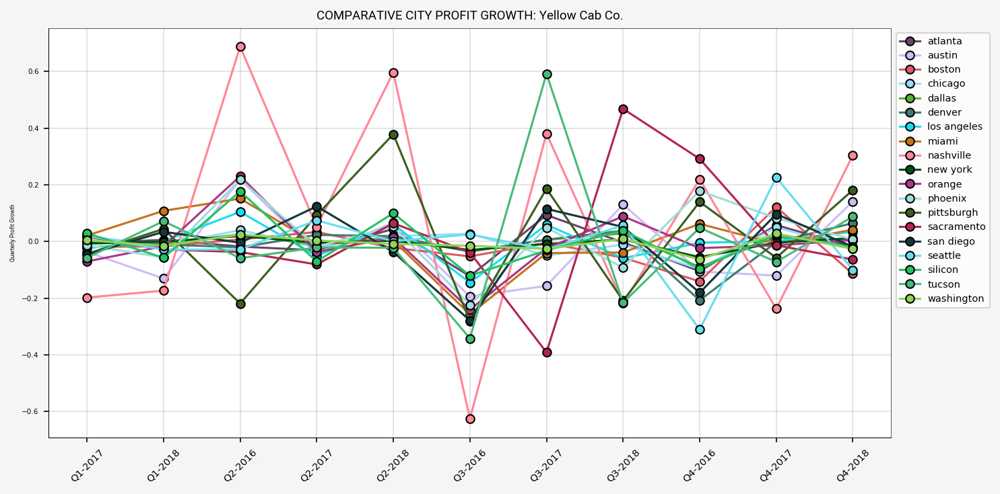

In [133]:
# Group the data
qrtrly_mrkt_share = mdf.groupby(['city', 'quarters', 'company'], dropna=True)['profit'].sum() / mdf.groupby(['city', 'quarters'])['profit'].sum()

# Create df to store the quarterly market share data for each city
mrkt_share_df = qrtrly_mrkt_share.unstack(level='company').reset_index()

# Step 3: Calculate growth rates for each city and each cab company
mrkt_share_df['pink growth_rate'] = mrkt_share_df.groupby('city', dropna=True)['pink cab'].pct_change()
mrkt_share_df['yellow growth_rate'] = mrkt_share_df.groupby('city', dropna=True)['yellow cab'].pct_change()

# Drop 'nan', and extreme outlier
mrkt_share_df.drop(0, axis=0, inplace=True)
mrkt_share_df.drop(62, axis=0, inplace=True)

## Visualize the quarter growth rates
fig15, ax15 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('city')):
    plt.plot(data['quarters'], data['pink growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig15, ax15, '', 'Quarterly Profit Growth', 'COMPARATIVE CITY PROFIT GROWTH: Pink Cab Co.' )

# Plot growth rates for yellow cab
fig16, ax16 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('city')):
    plt.plot(data['quarters'], data['yellow growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig16, ax16, '', 'Quarterly Profit Growth', 'COMPARATIVE CITY PROFIT GROWTH: Yellow Cab Co.')







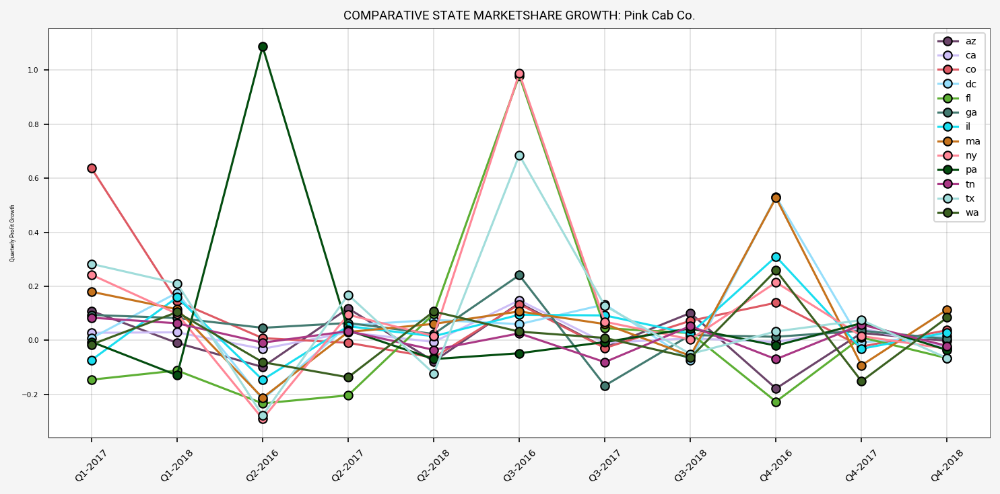

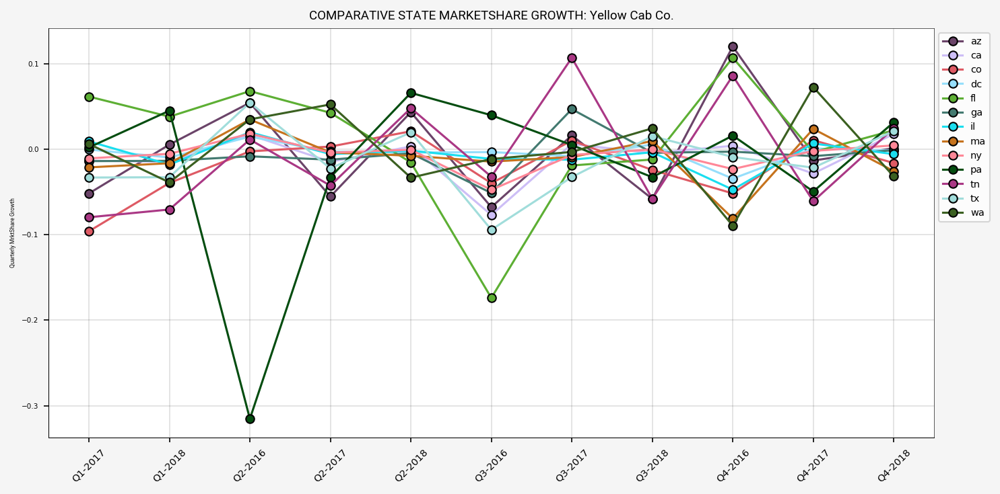

In [134]:
# Group the data
qrtrly_mrkt_share = mdf.groupby(['state', 'quarters', 'company'])['price'].sum() / mdf.groupby(['state', 'quarters'])['price'].sum()

# Create df to store the quarterly market share data for each city
mrkt_share_df = qrtrly_mrkt_share.unstack(level='company').reset_index()

# Step 3: Calculate growth rates for each city and each cab company
mrkt_share_df['pink growth_rate'] = mrkt_share_df.groupby('state')['pink cab'].pct_change()
mrkt_share_df['yellow growth_rate'] = mrkt_share_df.groupby('state')['yellow cab'].pct_change()


## Visualize the quarter growth rates

fig16, ax16 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('state')):
    plt.plot(data['quarters'], data['pink growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig16, ax16, '', 'Quarterly Profit Growth', 'COMPARATIVE STATE MARKETSHARE GROWTH: Pink Cab Co.' )


fig17, ax17 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('state')):
    plt.plot(data['quarters'], data['yellow growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig17, ax17, '', 'Quarterly MrktShare Growth', 'COMPARATIVE STATE MARKETSHARE GROWTH: Yellow Cab Co.' )

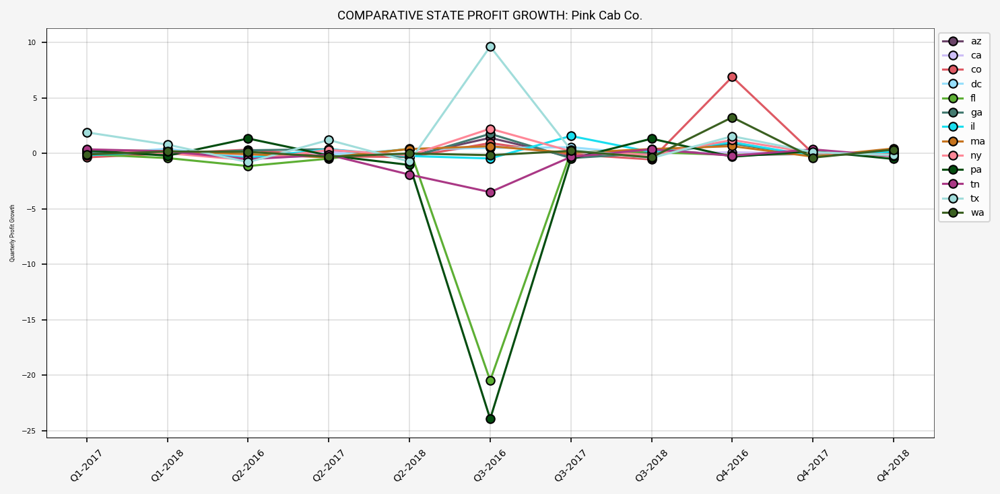

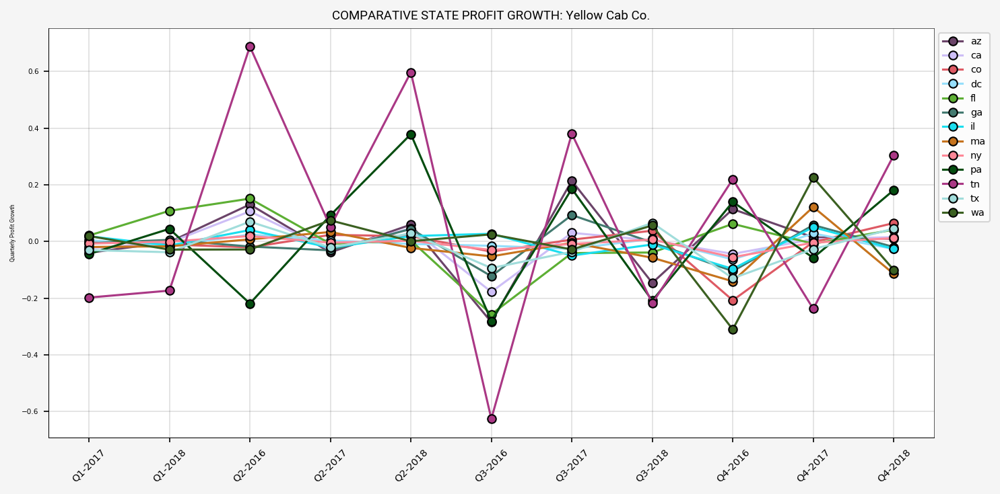

In [135]:
# Group the data
qrtrly_mrkt_share = mdf.groupby(['state', 'quarters', 'company'])['profit'].sum() / mdf.groupby(['state', 'quarters'])['profit'].sum()

# Create df to store the quarterly market share data for each city
mrkt_share_df = qrtrly_mrkt_share.unstack(level='company').reset_index()

# Step 3: Calculate growth rates for each city and each cab company
mrkt_share_df['pink growth_rate'] = mrkt_share_df.groupby('state')['pink cab'].pct_change()
mrkt_share_df['yellow growth_rate'] = mrkt_share_df.groupby('state')['yellow cab'].pct_change()

# Drop 'nan', and extreme outlier
mrkt_share_df.drop(0, axis=0, inplace=True)
mrkt_share_df.drop(26, axis=0, inplace=True)

## Visualize the quarter growth rates
fig18, ax18 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('state')):
    plt.plot(data['quarters'], data['pink growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig18, ax18, '', 'Quarterly Profit Growth', 'COMPARATIVE STATE PROFIT GROWTH: Pink Cab Co.' )


fig19, ax19 = plt.subplots(figsize=(10, 5), dpi=150)

for i, (city, data) in enumerate(mrkt_share_df.groupby('state')):
    plt.plot(data['quarters'], data['yellow growth_rate'], label=city, marker='o', color=colorz[i], markeredgecolor='black')
format_plot(mrkt_share_df, fig19, ax19, '', 'Quarterly Profit Growth', 'COMPARATIVE STATE PROFIT GROWTH: Yellow Cab Co.' )


In [ ]:
# Results: Each company has it strengths and weakneses. However, I would recommend not to buy pink cab, 
# and be cautious with buying Yellow cab. While histoically Yellow Cab
# Is performing much better than pink, an identical trend was discovered within both of Pink Cabs and Yellow Cabs 
# profit history, and then forecasted. In short, each successive yearly cycle is generating less profits. This can be seen with the three years
# of data that we have looked at thus far. To see if this trend is part of a larger trend. More years of data needs to be
# analyzed. If the current profit trend contiues it's course, both companies will be in the red by 2020. 
# XYZ should keep in mind that traditional cab companies profits, have been getting eaten up by rideshare companies like 
# Uber and Lyft over the past 5-10 years, and is what is most likely, in my opinion, the cause of the deacrease in profits.
# The trend that we see could be due to more users adopting to take Uber and Lyft instead of traditional cab companies. 
# Therefore, I recommend that XYZ, be cautious before buying Yellow cab, while simultaneously looking at potential 
# oppurtunities to run a fleet of rideshare vehicles.

## The supporting evidence will be showcased during the presentation. Thank you. 